<h1> <center> Transcriptomics of symptomatic hosts, potato and mint,$\\$ and asymptomatic host, mustard, during infection with host-adapted isolates of $Verticillim\; dahliae$ </center></h1>         

#### <h1> Authors: David Linnard Wheeler| Jeness Scott | Jeremiah Kam Sung Dung | Dennis Johnson </h1>         

## Table of Contents: <a class="anchor" id="toc-q"></a>
* [Objectives](#first-q)
* [Hypotheses](#second-q)
* [Experimental design](#third-q)
* [Matierial and Methods](#fourth-q)
* [Open data](#fifth-q)
* [Curate data](#sixth-q)
* [Summary statistics](#seventh-q)
* [Exploratory data analyses](#eighth-q)
* [Diagnostics](#nineth-q)
* [Parametric analyses: differential expression analysis](#tenth-q)
* [Visualization](#eleventh-q)
* [Export data](#twelveth-q)
* [Graveyard](#thirteenth-q)
* [Resources](#fourteenth-q)

### Objectives <a class="anchor" id="first-q"></a>  
[Back to Table of Contents](#toc-q)

* Characterize the differentially expressed genes involved in symptomatic (potato and mint) and asymptomatic interactions (mustard) between hosts and $Verticillium\; dahliae$ 

### Hypotheses <a class="anchor" id="second-q"></a>  
[Back to Table of Contents](#toc-q)

* **Science $H_o$ 1**: There are no differentially expressed genes (i) between symptomatic and asymptomatic hosts, (ii) between isolates within a host, and (iii) between hosts within an isolate.
* **Science $H_o$ 2**: Symptomatic and asymptomatic hosts exhibit similar responses to $V.\; dahliae$ infection
* **Science $H_o$ 3**: Gene expression of $V.\;dahliae$ does not differ accross fungal strains or between asymptomatic and symptomatic hosts
* **Statistical $H_o$**: 
    * Observed variation in DEG across treatments represents random variation, not systematic effects of hosts or isolates Variation in the DEG is unrelated to variation in the hosts and isolates and is no greater than expected by chance or sampling error.
    * More formally:
    
    $K_{ij} \sim NB(\mu_{ij}, \alpha_i)$
    
    where the counts, $K_{ij}$ for each gene, $i$, and sample, $j$, follow a negative binomial with the mean,$\mu_{ij}$, and dispersion parameter for each gene, $\alpha_i$. The dispersion parameter,$\alpha_i$, describes  the relationship between variance of an observed count and its mean value- the expected distance of the observed count from its mean. The mean,$\mu_{ij}$, can be decomposed into a sample-specific size factor, $s_j$, and a parameter,$q_{ij}$, that is proportional to the expected concentation of transcripts for sample $j$:
    
    $\mu_{ij} = s_j q_{ij}$
    
    Log2 fold changes for gene $i$ in each column of the model matrix, $X$,are provided by the coefficients, $\beta_i$:
    
    $log_2(q_{ij}) = x_{j.}\beta_i$
    
    * In short, the effect sizes between the groups are 0.

### Experimental design<a class="anchor" id="third-q"></a>  
[Back to Table of Contents](#toc-q)

* **Treatment structure**: 2 way factorial
    * **Independent variables**: 
        * 3 hosts:
            1. Potato 'Russet Burbank'
            2. Mint 'Black Mitchum'
            3. Brown mustard 'ISCI 99'
        * 3 fungi:
            1. $Verticillium\; dahliae\; 653$
            2. $Verticillium\; dahliae\; 111$
            3. Non-inoculated control
        * 1 time point:
            * 10 days after inoculation
        * 3 replicates
    * **Dependent variables**:
        * Constructs: 
            * Gene expression
        * Variables: 
            * Counts of RNA transcripts
            
* **Design structure**: randomized complete block design    
* **Observational unit**: plant
* **Experimental unit**: plant
* **Samples**: whole plants
* **Data**: 
    * RNA quantity and quality
    * Counts of RNA transcripts
* **Analysis**: 
    * Differential gene expression analyses        

### Materials and Methods<a class="anchor" id="fourth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Inoculum preparation for root dips (3.5"pot)**:
    * Inoculum for isolates 653 and 111:
       * 180 plants/3 isolates = 60 plants/isolate $\cdot$ 100 ml/plant (Dung et al. 2010) = 6000 ml = 6 L inoculum
       * 6 L of 10$^6$ conidia/ml inoculum is needed
       * 6 L/200 ml/flask = 30 flasks 
    
    * Trial one planted: 5/1/2018
    * Trial one inoculated: 5/19/2018
    * First Harvest: potato, mint, and mustards harvested @ 10 dpi on 5/29/2018

### Open data<a class="anchor" id="fifth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Install and invoke packages**

In [1]:
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("DEFormats", version = "3.8")

Bioconductor version 3.8 (BiocManager 1.30.4), R 3.5.2 (2018-12-20)
Installing package(s) 'DEFormats'



The downloaded binary packages are in
	/var/folders/8c/7fwkqlvd4ps_rj6zf9lr_xcw0000gn/T//RtmptF4nug/downloaded_packages


Update old packages: 'annotate', 'assertthat', 'BiocInstaller', 'callr', 'cli',
  'colorspace', 'gtable', 'highr', 'knitr', 'lazyeval', 'openssl', 'pkgbuild',
  'processx', 'purrr', 'Rcpp', 'RcppArmadillo', 'readxl', 'rgdal', 'rlang',
  'rmarkdown', 'rstudioapi', 'spam', 'sys', 'tibble', 'tinytex', 'XML',
  'diffobj', 'e1071', 'fs', 'git2r', 'Matrix', 'mgcv', 'zoo'


In [2]:
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("apeglm", version = "3.8")

Bioconductor version 3.8 (BiocManager 1.30.4), R 3.5.2 (2018-12-20)
Installing package(s) 'apeglm'



The downloaded binary packages are in
	/var/folders/8c/7fwkqlvd4ps_rj6zf9lr_xcw0000gn/T//RtmptF4nug/downloaded_packages


Update old packages: 'annotate', 'assertthat', 'BiocInstaller', 'callr', 'cli',
  'colorspace', 'gtable', 'highr', 'knitr', 'lazyeval', 'openssl', 'pkgbuild',
  'processx', 'purrr', 'Rcpp', 'RcppArmadillo', 'readxl', 'rgdal', 'rlang',
  'rmarkdown', 'rstudioapi', 'spam', 'sys', 'tibble', 'tinytex', 'XML',
  'diffobj', 'e1071', 'fs', 'git2r', 'Matrix', 'mgcv', 'zoo'


In [1]:
library("data.table")
library("tibble")
library("eulerr")
library("apeglm")
library("DESeq2")
library("edgeR")
library("DEFormats")
library("dplyr")
library("ggplot2")
library("reshape2")
library("pheatmap")
library("RColorBrewer")
library("PoiClaClu")
library("ggbeeswarm")
library("EnhancedVolcano")
library("devtools")
library("gridExtra")
library("grid")
library("cowplot")
library("genefilter")
library("viridis")
library("VennDiagram")
library("prob")
library("seqinr")
library("stringr")

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which, which.max, which.min



Attaching package: ‘S4Vectors’


The

* Grab working directory

In [2]:
getwd()

[1] "/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/SCRIPTS"

* Set working directory

In [3]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Reads/")

* **Open data**

Fragments

In [4]:
DF = read.csv("Solanum_reads.csv",header=T)

Gene names

In [5]:
gnDF = read.csv("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Gene_names/DGE_GENE_NAME/Solanum_DEG_genename.csv",
                header=T)


In [6]:
names(gnDF)[2]<-"id"
names(gnDF)[3]<-"Comparison"
names(gnDF)[6]<-"KO.Name"
names(gnDF)[10]<-"Hit1_acc"

Sequences

In [7]:
fastafile <- read.fasta(file = "/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Sequences/Potato_gene.fasta", 
                       seqtype = "AA",as.string = TRUE, set.attributes = FALSE)



Gene ontology

In [8]:
GO = read.csv("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA/R_FILES/Gene_ontology/Potato_gene.goannot.csv",
                header=T)


### Curate data<a class="anchor" id="sixth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Set first column to index**

In [9]:
DF_1 <- data.frame(DF[,-1], row.names = DF[,1])

In [10]:
head(DF_1)

,S1_1_2_2,S1_1_2_3,S1_1_2_6,S1_2_2_1,S1_2_2_2,S1_2_2_4,S1_3_2_3,S1_3_2_4,S1_3_2_5
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
PGSC0003DMG400018887,292,275,200,200,304,185,156,130,125
PGSC0003DMG400047158,0,0,0,0,0,0,0,0,0
PGSC0003DMG400018623,16,18,13,8,12,10,16,18,19
PGSC0003DMG400030952,679,551,661,978,776,791,573,412,509
PGSC0003DMG400000217,18,50,30,4,5,13,66,16,24
PGSC0003DMG400012269,1046,1039,996,1181,1059,1193,648,625,724


* **For mint and mustard only, round floats/decimals to integer counts: since these data were generated $de\; novo$ decimals are abound**

In [11]:
DF = round(DF_1, digits = 0)

* **Create DGEList Object**

> * Convert dataframe to matrix

In [12]:
df = data.matrix(DF_1)

* **Vector for column/treatment names**

In [13]:
group = rep(c("653", "111", "Control"), each = 3)

In [14]:
group

[1] "653"     "653"     "653"     "111"     "111"     "111"     "Control"
[8] "Control" "Control"

In [15]:
dge = DGEList(df, group = group)

In [16]:
dge

,S1_1_2_2,S1_1_2_3,S1_1_2_6,S1_2_2_1,S1_2_2_2,S1_2_2_4,S1_3_2_3,S1_3_2_4,S1_3_2_5
PGSC0003DMG400018887,292,275,200,200,304,185,156,130,125
PGSC0003DMG400047158,0,0,0,0,0,0,0,0,0
PGSC0003DMG400018623,16,18,13,8,12,10,16,18,19
PGSC0003DMG400030952,679,551,661,978,776,791,573,412,509
PGSC0003DMG400000217,18,50,30,4,5,13,66,16,24
PGSC0003DMG400012269,1046,1039,996,1181,1059,1193,648,625,724
PGSC0003DMG400011061,2,0,2,0,3,0,1,2,0
PGSC0003DMG400044029,0,0,0,0,0,0,0,0,0
PGSC0003DMG401008875,221,171,149,253,189,250,159,163,176
PGSC0003DMG402006676,0,0,0,0,0,0,0,0,0


* **Coerce DGElist to DESeqDataSet**

In [17]:
dds = as.DESeqDataSet(dge)

  it appears that the last variable in the design formula, 'group',
  has a factor level, 'Control', which is not the reference level. we recommend
  to use factor(...,levels=...) or relevel() to set this as the reference level
  before proceeding. for more information, please see the 'Note on factor levels'
  in vignette('DESeq2').



In [18]:
dds

class: DESeqDataSet 
dim: 46596 9 
metadata(1): version
assays(1): counts
rownames(46596): PGSC0003DMG400018887 PGSC0003DMG400047158 ...
  PGSC0003DMG400046885 PGSC0003DMG400035775
rowData names(0):
colnames(9): S1_1_2_2 S1_1_2_3 ... S1_3_2_4 S1_3_2_5
colData names(3): group lib.size norm.factors

### Summary Statistics<a class="anchor" id="seventh-q"></a>  
[Back to Table of Contents](#toc-q)

**The total number of DEGS per comparison**

In [68]:
table(DEGS$Comparison)


653v111   Cv111   Cv653 
     79    1124    1751 

Tabulate DEG data (Comparison - basemean -direction of regulation - log 2 -fold change -  𝑝 -value - adjusted  𝑝 -value - gene name - function)

**DEGs from 653 vs Control**

In [69]:
Cv653_gn = subset(Cv653_GeneNames, Comparison == "Cv653")

* Order genes by fold change

In [70]:
table_cv6 <- (Cv653_gn[order((-Cv653_gn$log2FoldChange)),c(9,1,2,3,6,7,16)])

- Round digits

In [71]:
table_cv6$baseMean <- round(table_cv6$baseMean, 1)
table_cv6$log2FoldChange <- round(table_cv6$log2FoldChange, 1)
table_cv6$pvalue <- round(table_cv6$pvalue, 7)
table_cv6$padj <- round(table_cv6$padj, 7)

- Format columns

> - Comparison

In [72]:
table_cv6$Comparison = "653 vs control"

> - Host

In [73]:
table_cv6$Host = "Solanum tuberosum" 

> - Gene function

In [74]:
table_cv6$Function = NA

> - Sequence

In [75]:
table_cv6$Sequence = NA

- Reorder columns

In [76]:
table_cv6 = table_cv6[,c(8,1,3:7,2,9:10)]

- Grab top 5 genes

In [77]:
Up_cv6 = head(table_cv6,n=5)

> - Add column for regulation status

In [78]:
Up_cv6$Regulation = "up"

- Grab botton 5 genes

In [79]:
Down_cv6 = tail(table_cv6,n=5)

> - Add column for regulation status

In [80]:
Down_cv6$Regulation = "down"

* Table for control vs 653

In [81]:
Table_cv6 = rbind(Up_cv6,Down_cv6)

In [82]:
dog = 1

In [83]:
Table_cv6

,Host,Comparison,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence,Regulation
424,Solanum tuberosum,653 vs control,949.1,2.8,0,0.0e+00,PRS2_SOLTU,PGSC0003DMG400001550,NA,NA,up
2842,Solanum tuberosum,653 vs control,173.2,2.6,0,0.0e+00,-,PGSC0003DMG402007970,NA,NA,up
535,Solanum tuberosum,653 vs control,1156.5,2.5,0,0.0e+00,IER1_SOLLC,PGSC0003DMG400003056,NA,NA,up
1962,Solanum tuberosum,653 vs control,137.3,2.4,0,1.0e-07,PR04_SOLLC,PGSC0003DMG400023922,NA,NA,up
1723,Solanum tuberosum,653 vs control,49.5,2.2,0,2.1e-06,WRK75_ARATH,PGSC0003DMG400020206,NA,NA,up
845,Solanum tuberosum,653 vs control,41.2,-2.5,0,0.0e+00,DOT3_ARATH,PGSC0003DMG400007239,NA,NA,down
1579,Solanum tuberosum,653 vs control,66.2,-2.6,0,0.0e+00,C71A4_SOLME,PGSC0003DMG400018141,NA,NA,down
811,Solanum tuberosum,653 vs control,46.6,-2.7,0,0.0e+00,-,PGSC0003DMG400006720,NA,NA,down
2875,Solanum tuberosum,653 vs control,368.1,-2.9,0,0.0e+00,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA,down
1998,Solanum tuberosum,653 vs control,395.0,-3.7,0,0.0e+00,-,PGSC0003DMG400024310,NA,NA,down


- Rearrange columns

In [84]:
Table_cv6 = Table_cv6[,c(1:2,11,3:10)]

In [85]:
Table_cv6

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
424,Solanum tuberosum,653 vs control,up,949.1,2.8,0,0.0e+00,PRS2_SOLTU,PGSC0003DMG400001550,NA,NA
2842,Solanum tuberosum,653 vs control,up,173.2,2.6,0,0.0e+00,-,PGSC0003DMG402007970,NA,NA
535,Solanum tuberosum,653 vs control,up,1156.5,2.5,0,0.0e+00,IER1_SOLLC,PGSC0003DMG400003056,NA,NA
1962,Solanum tuberosum,653 vs control,up,137.3,2.4,0,1.0e-07,PR04_SOLLC,PGSC0003DMG400023922,NA,NA
1723,Solanum tuberosum,653 vs control,up,49.5,2.2,0,2.1e-06,WRK75_ARATH,PGSC0003DMG400020206,NA,NA
845,Solanum tuberosum,653 vs control,down,41.2,-2.5,0,0.0e+00,DOT3_ARATH,PGSC0003DMG400007239,NA,NA
1579,Solanum tuberosum,653 vs control,down,66.2,-2.6,0,0.0e+00,C71A4_SOLME,PGSC0003DMG400018141,NA,NA
811,Solanum tuberosum,653 vs control,down,46.6,-2.7,0,0.0e+00,-,PGSC0003DMG400006720,NA,NA
2875,Solanum tuberosum,653 vs control,down,368.1,-2.9,0,0.0e+00,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA
1998,Solanum tuberosum,653 vs control,down,395.0,-3.7,0,0.0e+00,-,PGSC0003DMG400024310,NA,NA


- Rename column headers

In [86]:
names(Table_cv6)[4] = "Base mean"
names(Table_cv6)[5] = "Log2 fold change"
names(Table_cv6)[6] = "p-value"
names(Table_cv6)[7] = "adjusted p-value"
names(Table_cv6)[8] = "Gene name"
names(Table_cv6)[9] = "Gene ID"
names(Table_cv6)[10] = "Function"
names(Table_cv6)[11] = "Sequence"

In [87]:
Table_cv6

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
424,Solanum tuberosum,653 vs control,up,949.1,2.8,0,0.0e+00,PRS2_SOLTU,PGSC0003DMG400001550,NA,NA
2842,Solanum tuberosum,653 vs control,up,173.2,2.6,0,0.0e+00,-,PGSC0003DMG402007970,NA,NA
535,Solanum tuberosum,653 vs control,up,1156.5,2.5,0,0.0e+00,IER1_SOLLC,PGSC0003DMG400003056,NA,NA
1962,Solanum tuberosum,653 vs control,up,137.3,2.4,0,1.0e-07,PR04_SOLLC,PGSC0003DMG400023922,NA,NA
1723,Solanum tuberosum,653 vs control,up,49.5,2.2,0,2.1e-06,WRK75_ARATH,PGSC0003DMG400020206,NA,NA
845,Solanum tuberosum,653 vs control,down,41.2,-2.5,0,0.0e+00,DOT3_ARATH,PGSC0003DMG400007239,NA,NA
1579,Solanum tuberosum,653 vs control,down,66.2,-2.6,0,0.0e+00,C71A4_SOLME,PGSC0003DMG400018141,NA,NA
811,Solanum tuberosum,653 vs control,down,46.6,-2.7,0,0.0e+00,-,PGSC0003DMG400006720,NA,NA
2875,Solanum tuberosum,653 vs control,down,368.1,-2.9,0,0.0e+00,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA
1998,Solanum tuberosum,653 vs control,down,395.0,-3.7,0,0.0e+00,-,PGSC0003DMG400024310,NA,NA


**DEGs from 111 vs Control**

In [88]:
Cv111_gn = subset(Cv111_GeneNames, Comparison == "Cv111")

Remove DEGS/rows from humans

In [89]:
Cv111_gn = Cv111_gn[!grepl("STAS1", Cv111_gn$Hit1_acc ),]

* Order genes by fold change

In [90]:
table_cv1 <- (Cv111_gn[order((-Cv111_gn$log2FoldChange)),c(9,1,2,3,6,7,16)])

- Round digits

In [91]:
table_cv1$baseMean <- round(table_cv1$baseMean, 1)
table_cv1$log2FoldChange <- round(table_cv1$log2FoldChange, 1)
table_cv1$pvalue <- round(table_cv1$pvalue, 7)
table_cv1$padj <- round(table_cv1$padj, 7)

* Format Columns

> * Comparisons

In [92]:
table_cv1$Comparison = "111 vs control"

- Host

In [93]:
table_cv1$Host = "Solanum tuberosum"

> - Gene function

In [94]:
table_cv1$Function = NA

* Sequence

In [95]:
table_cv1$Sequence = NA

* Reorder columns

In [96]:
table_cv1 = table_cv1[,c(8,1,3:7,2,9:10)]

* Grab top 5 DEGs

In [97]:
Up_cv1 = head(table_cv1,n=5)

> - Column for regulation status

In [98]:
Up_cv1$Regulation = "up"

> - Grab bottom 5 DEGs

In [99]:
Down_cv1 = tail(table_cv1,n=5)

> - Column for regulation status

In [100]:
Down_cv1$Regulation = "down"

* Table for control vs 111

In [101]:
Table_cv1 = rbind(Up_cv1,Down_cv1)

In [102]:
Table_cv1

,Host,Comparison,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence,Regulation
2841,Solanum tuberosum,111 vs control,173.2,2.2,0,0,-,PGSC0003DMG402007970,NA,NA,up
1772,Solanum tuberosum,111 vs control,941.9,2.2,0,0,-,PGSC0003DMG400020844,NA,NA,up
519,Solanum tuberosum,111 vs control,158.5,2.1,0,0,-,PGSC0003DMG400002821,NA,NA,up
1492,Solanum tuberosum,111 vs control,180.2,2.0,0,0,RBCX1_ARATH,PGSC0003DMG400016462,NA,NA,up
2823,Solanum tuberosum,111 vs control,72.2,2.0,0,0,NUDT8_ARATH,PGSC0003DMG402002270,NA,NA,up
2403,Solanum tuberosum,111 vs control,537.1,-2.7,0,0,CHSB_SOLTU,PGSC0003DMG400029620,NA,NA,down
2657,Solanum tuberosum,111 vs control,97.2,-2.7,0,0,EDL3_ARATH,PGSC0003DMG400042481,NA,NA,down
1697,Solanum tuberosum,111 vs control,241.2,-2.7,0,0,WRK40_ARATH,PGSC0003DMG400019824,NA,NA,down
2874,Solanum tuberosum,111 vs control,368.1,-2.9,0,0,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA,down
1997,Solanum tuberosum,111 vs control,395.0,-3.0,0,0,-,PGSC0003DMG400024310,NA,NA,down


* Rearrange columns

In [103]:
Table_cv1 = Table_cv1[,c(1:2,11,3:10)]

In [104]:
Table_cv1

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
2841,Solanum tuberosum,111 vs control,up,173.2,2.2,0,0,-,PGSC0003DMG402007970,NA,NA
1772,Solanum tuberosum,111 vs control,up,941.9,2.2,0,0,-,PGSC0003DMG400020844,NA,NA
519,Solanum tuberosum,111 vs control,up,158.5,2.1,0,0,-,PGSC0003DMG400002821,NA,NA
1492,Solanum tuberosum,111 vs control,up,180.2,2.0,0,0,RBCX1_ARATH,PGSC0003DMG400016462,NA,NA
2823,Solanum tuberosum,111 vs control,up,72.2,2.0,0,0,NUDT8_ARATH,PGSC0003DMG402002270,NA,NA
2403,Solanum tuberosum,111 vs control,down,537.1,-2.7,0,0,CHSB_SOLTU,PGSC0003DMG400029620,NA,NA
2657,Solanum tuberosum,111 vs control,down,97.2,-2.7,0,0,EDL3_ARATH,PGSC0003DMG400042481,NA,NA
1697,Solanum tuberosum,111 vs control,down,241.2,-2.7,0,0,WRK40_ARATH,PGSC0003DMG400019824,NA,NA
2874,Solanum tuberosum,111 vs control,down,368.1,-2.9,0,0,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA
1997,Solanum tuberosum,111 vs control,down,395.0,-3.0,0,0,-,PGSC0003DMG400024310,NA,NA


* Rename column headers

In [105]:
names(Table_cv1)[4] = "Base mean"
names(Table_cv1)[5] = "Log2 fold change"
names(Table_cv1)[6] = "p-value"
names(Table_cv1)[7] = "adjusted p-value"
names(Table_cv1)[8] = "Gene name"
names(Table_cv1)[9] = "Gene ID"
names(Table_cv1)[10] = "Function"
names(Table_cv1)[11] = "Sequence"

In [106]:
Table_cv1

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
2841,Solanum tuberosum,111 vs control,up,173.2,2.2,0,0,-,PGSC0003DMG402007970,NA,NA
1772,Solanum tuberosum,111 vs control,up,941.9,2.2,0,0,-,PGSC0003DMG400020844,NA,NA
519,Solanum tuberosum,111 vs control,up,158.5,2.1,0,0,-,PGSC0003DMG400002821,NA,NA
1492,Solanum tuberosum,111 vs control,up,180.2,2.0,0,0,RBCX1_ARATH,PGSC0003DMG400016462,NA,NA
2823,Solanum tuberosum,111 vs control,up,72.2,2.0,0,0,NUDT8_ARATH,PGSC0003DMG402002270,NA,NA
2403,Solanum tuberosum,111 vs control,down,537.1,-2.7,0,0,CHSB_SOLTU,PGSC0003DMG400029620,NA,NA
2657,Solanum tuberosum,111 vs control,down,97.2,-2.7,0,0,EDL3_ARATH,PGSC0003DMG400042481,NA,NA
1697,Solanum tuberosum,111 vs control,down,241.2,-2.7,0,0,WRK40_ARATH,PGSC0003DMG400019824,NA,NA
2874,Solanum tuberosum,111 vs control,down,368.1,-2.9,0,0,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA
1997,Solanum tuberosum,111 vs control,down,395.0,-3.0,0,0,-,PGSC0003DMG400024310,NA,NA


**DEGs from 653 vs 111**

In [107]:
i653v111_gn = subset(i653v111_GeneNames, Comparison == "653v111")

* Order genes by fold change

In [108]:
table_6v1 <- (i653v111_gn[order((-i653v111_gn$log2FoldChange)),c(9,1,2,3,6,7,16)])

* Round digits

In [109]:
table_6v1$baseMean <- round(table_6v1$baseMean, 1)
table_6v1$log2FoldChange <- round(table_6v1$log2FoldChange, 1)
table_6v1$pvalue <- round(table_6v1$pvalue, 7)
table_6v1$padj <- round(table_6v1$padj, 7)

* Format columns

> * By Columns

In [110]:
table_6v1$Comparison = "111 vs 653"

* Host

In [111]:
table_6v1$Host = "Solanum tuberosum"

> * Gene function

In [112]:
table_6v1$Function = NA

> * Sequence

In [113]:
table_6v1$Sequence = NA

* Reorder columns

In [114]:
table_6v1 = table_6v1[,c(8,1,3:7,2,9:10)]

> * Grab top 5 genes

In [115]:
Up_6v1 = head(table_6v1,n=5)

> * Column for regulation

In [116]:
Up_6v1$Regulation = "up"

> - Grab bottom 5 DEGs

In [117]:
Down_6v1 = tail(table_6v1,n=5)

> * Column for regulation

In [118]:
Down_6v1$Regulation = "down"

* Table 653 vs 111

In [119]:
Table_6v1 = rbind(Up_6v1,Down_6v1)

* Rearrange columns

In [120]:
Table_6v1 = Table_6v1[,c(1:2,11,3:10)]

In [121]:
Table_6v1

,Host,Comparison,Regulation,baseMean,log2FoldChange,pvalue,padj,Hit1_acc,id,Function,Sequence
116,Solanum tuberosum,111 vs 653,up,50.6,1.9,1.0e-07,0.0000732,ODBA2_ARATH,Novel01306,NA,NA
2803,Solanum tuberosum,111 vs 653,up,41.5,1.8,3.0e-07,0.0002097,-,PGSC0003DMG401029257,NA,NA
400,Solanum tuberosum,111 vs 653,up,41.4,1.8,1.8e-06,0.0006819,TIF5A_ARATH,PGSC0003DMG400001178,NA,NA
1116,Solanum tuberosum,111 vs 653,up,152.7,1.7,0.0e+00,0.0000327,GRXS9_ARATH,PGSC0003DMG400011406,NA,NA
1775,Solanum tuberosum,111 vs 653,up,11069.2,1.7,2.0e-07,0.0001446,LOX12_SOLTU,PGSC0003DMG400020999,NA,NA
638,Solanum tuberosum,111 vs 653,down,2722.7,-2.1,0.0e+00,0.0000000,PRR1_TOBAC,PGSC0003DMG400004259,NA,NA
2188,Solanum tuberosum,111 vs 653,down,104.1,-2.2,0.0e+00,0.0000003,C7D55_HYOMU,PGSC0003DMG400026871,NA,NA
1001,Solanum tuberosum,111 vs 653,down,94.1,-2.2,0.0e+00,0.0000008,C7D55_HYOMU,PGSC0003DMG400009810,NA,NA
1329,Solanum tuberosum,111 vs 653,down,96.1,-2.3,0.0e+00,0.0000016,LTI65_ARATH,PGSC0003DMG400014293,NA,NA
1961,Solanum tuberosum,111 vs 653,down,137.3,-2.4,0.0e+00,0.0000003,PR04_SOLLC,PGSC0003DMG400023922,NA,NA


* Rename columns

In [122]:
names(Table_6v1)[4] = "Base mean"
names(Table_6v1)[5] = "Log2 fold change"
names(Table_6v1)[6] = "p-value"
names(Table_6v1)[7] = "adjusted p-value"
names(Table_6v1)[8] = "Gene name"
names(Table_6v1)[9] = "Gene ID"
names(Table_6v1)[10] = "Function"
names(Table_6v1)[11] = "Sequence"

In [123]:
Table_6v1

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
116,Solanum tuberosum,111 vs 653,up,50.6,1.9,1.0e-07,0.0000732,ODBA2_ARATH,Novel01306,NA,NA
2803,Solanum tuberosum,111 vs 653,up,41.5,1.8,3.0e-07,0.0002097,-,PGSC0003DMG401029257,NA,NA
400,Solanum tuberosum,111 vs 653,up,41.4,1.8,1.8e-06,0.0006819,TIF5A_ARATH,PGSC0003DMG400001178,NA,NA
1116,Solanum tuberosum,111 vs 653,up,152.7,1.7,0.0e+00,0.0000327,GRXS9_ARATH,PGSC0003DMG400011406,NA,NA
1775,Solanum tuberosum,111 vs 653,up,11069.2,1.7,2.0e-07,0.0001446,LOX12_SOLTU,PGSC0003DMG400020999,NA,NA
638,Solanum tuberosum,111 vs 653,down,2722.7,-2.1,0.0e+00,0.0000000,PRR1_TOBAC,PGSC0003DMG400004259,NA,NA
2188,Solanum tuberosum,111 vs 653,down,104.1,-2.2,0.0e+00,0.0000003,C7D55_HYOMU,PGSC0003DMG400026871,NA,NA
1001,Solanum tuberosum,111 vs 653,down,94.1,-2.2,0.0e+00,0.0000008,C7D55_HYOMU,PGSC0003DMG400009810,NA,NA
1329,Solanum tuberosum,111 vs 653,down,96.1,-2.3,0.0e+00,0.0000016,LTI65_ARATH,PGSC0003DMG400014293,NA,NA
1961,Solanum tuberosum,111 vs 653,down,137.3,-2.4,0.0e+00,0.0000003,PR04_SOLLC,PGSC0003DMG400023922,NA,NA


**Combine all tables**

In [124]:
table_all = rbind(Table_cv6, Table_cv1, Table_6v1)

In [125]:
table_all 

,Host,Comparison,Regulation,Base mean,Log2 fold change,p-value,adjusted p-value,Gene name,Gene ID,Function,Sequence
424,Solanum tuberosum,653 vs control,up,949.1,2.8,0.0e+00,0.0000000,PRS2_SOLTU,PGSC0003DMG400001550,NA,NA
2842,Solanum tuberosum,653 vs control,up,173.2,2.6,0.0e+00,0.0000000,-,PGSC0003DMG402007970,NA,NA
535,Solanum tuberosum,653 vs control,up,1156.5,2.5,0.0e+00,0.0000000,IER1_SOLLC,PGSC0003DMG400003056,NA,NA
1962,Solanum tuberosum,653 vs control,up,137.3,2.4,0.0e+00,0.0000001,PR04_SOLLC,PGSC0003DMG400023922,NA,NA
1723,Solanum tuberosum,653 vs control,up,49.5,2.2,0.0e+00,0.0000021,WRK75_ARATH,PGSC0003DMG400020206,NA,NA
845,Solanum tuberosum,653 vs control,down,41.2,-2.5,0.0e+00,0.0000000,DOT3_ARATH,PGSC0003DMG400007239,NA,NA
1579,Solanum tuberosum,653 vs control,down,66.2,-2.6,0.0e+00,0.0000000,C71A4_SOLME,PGSC0003DMG400018141,NA,NA
811,Solanum tuberosum,653 vs control,down,46.6,-2.7,0.0e+00,0.0000000,-,PGSC0003DMG400006720,NA,NA
2875,Solanum tuberosum,653 vs control,down,368.1,-2.9,0.0e+00,0.0000000,ABAH1_ARATH,PGSC0003DMG402018475,NA,NA
1998,Solanum tuberosum,653 vs control,down,395.0,-3.7,0.0e+00,0.0000000,-,PGSC0003DMG400024310,NA,NA


**Insert sequences**

First, subset the target sequences from the fasta file

In [126]:
seqs = fastafile[names(fastafile) %in% table_all[,9]]

Sanity Checks

In [127]:
length(seqs)

[1] 26

In [128]:
length(seqs) == length(table_all[,9])

[1] FALSE

In [129]:
sum(abs(length(seqs) - length(table_all[,9])))

[1] 4

> * How many duplicate genes?

In [130]:
sum(duplicated(table_all[,9]))

[1] 4

* Extract gene IDs

In [131]:
names(seqs)

[1] "PGSC0003DMG400026871" "PGSC0003DMG400009810" "PGSC0003DMG400006720"
 [4] "Novel01306"           "PGSC0003DMG400004259" "PGSC0003DMG401029257"
 [7] "PGSC0003DMG400016462" "PGSC0003DMG400020206" "PGSC0003DMG400014293"
[10] "PGSC0003DMG400018141" "PGSC0003DMG400019824" "PGSC0003DMG400002821"
[13] "PGSC0003DMG402007970" "PGSC0003DMG400007239" "PGSC0003DMG400020844"
[16] "PGSC0003DMG400024310" "PGSC0003DMG400001178" "PGSC0003DMG400003056"
[19] "PGSC0003DMG400020999" "PGSC0003DMG402002270" "PGSC0003DMG402018475"
[22] "PGSC0003DMG400001550" "PGSC0003DMG400011406" "PGSC0003DMG400023922"
[25] "PGSC0003DMG400029620" "PGSC0003DMG400042481"

* Match names of gene IDs from fasta file with column in table

In [132]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,9])){

# For every entry in the list of sequences
    for (j in seq(names(seqs))){

        # If the row matches the sequence
        if (table_all[i,9] == names(seqs[j])){
            
            # Grab the gene ID
            y = names(seqs[j])
            
            # Grab the sequence
            x = (seqs[j]) # unlist
            
            #
            # x = (str_split(x, "''"))
            
            # Add gene ID to table
            table_all[i,12] = y

            # Add sequence to table
            table_all[i,11] = x
     }
        
 }

 }

* Table

In [133]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
424  Solanum tuberosum 653 vs control up           949.1    2.8            
2842 Solanum tuberosum 653 vs control up           173.2    2.6            
535  Solanum tuberosum 653 vs control up          1156.5    2.5            
1962 Solanum tuberosum 653 vs control up           137.3    2.4            
1723 Solanum tuberosum 653 vs control up            49.5    2.2            
845  Solanum tuberosum 653 vs control down          41.2   -2.5            
1579 Solanum tuberosum 653 vs control down          66.2   -2.6            
811  Solanum tuberosum 653 vs control down          46.6   -2.7            
2875 Solanum tuberosum 653 vs control down         368.1   -2.9            
1998 Solanum tuberosum 653 vs control down         395.0   -3.7            
2841 Solanum tuberosum 111 vs control up           173.2    2.2            
1772 Solanum tuberosum 111 vs control up           941.9    2.2            
519  Solanum tuberosum 111 vs control up           158.5    2.1            
1492 Solanum tuberosum 111 vs control up           180.2    2.0            
2823 Solanum tuberosum 111 vs control up            72.2    2.0            
2403 Solanum tuberosum 111 vs control down         537.1   -2.7            
2657 Solanum tuberosum 111 vs control down          97.2   -2.7            
1697 Solanum tuberosum 111 vs control down         241.2   -2.7            
2874 Solanum tuberosum 111 vs control down         368.1   -2.9            
1997 Solanum tuberosum 111 vs control down         395.0   -3.0            
116  Solanum tuberosum 111 vs 653     up            50.6    1.9            
2803 Solanum tuberosum 111 vs 653     up            41.5    1.8            
400  Solanum tuberosum 111 vs 653     up            41.4    1.8            
1116 Solanum tuberosum 111 vs 653     up           152.7    1.7            
1775 Solanum tuberosum 111 vs 653     up         11069.2    1.7            
638  Solanum tuberosum 111 vs 653     down        2722.7   -2.1            
2188 Solanum tuberosum 111 vs 653     down         104.1   -2.2            
1001 Solanum tuberosum 111 vs 653     down          94.1   -2.2            
1329 Solanum tuberosum 111 vs 653     down          96.1   -2.3            
1961 Solanum tuberosum 111 vs 653     down         137.3   -2.4            
     p-value adjusted p-value Gene name   Gene ID              Function
424  0.0e+00 0.0000000        PRS2_SOLTU  PGSC0003DMG400001550 NA      
2842 0.0e+00 0.0000000        -           PGSC0003DMG402007970 NA      
535  0.0e+00 0.0000000        IER1_SOLLC  PGSC0003DMG400003056 NA      
1962 0.0e+00 0.0000001        PR04_SOLLC  PGSC0003DMG400023922 NA      
1723 0.0e+00 0.0000021        WRK75_ARATH PGSC0003DMG400020206 NA      
845  0.0e+00 0.0000000        DOT3_ARATH  PGSC0003DMG400007239 NA      
1579 0.0e+00 0.0000000        C71A4_SOLME PGSC0003DMG400018141 NA      
811  0.0e+00 0.0000000        -           PGSC0003DMG400006720 NA      
2875 0.0e+00 0.0000000        ABAH1_ARATH PGSC0003DMG402018475 NA      
1998 0.0e+00 0.0000000        -           PGSC0003DMG400024310 NA      
2841 0.0e+00 0.0000000        -           PGSC0003DMG402007970 NA      
1772 0.0e+00 0.0000000        -           PGSC0003DMG400020844 NA      
519  0.0e+00 0.0000000        -           PGSC0003DMG400002821 NA      
1492 0.0e+00 0.0000000        RBCX1_ARATH PGSC0003DMG400016462 NA      
2823 0.0e+00 0.0000000        NUDT8_ARATH PGSC0003DMG402002270 NA      
2403 0.0e+00 0.0000000        CHSB_SOLTU  PGSC0003DMG400029620 NA      
2657 0.0e+00 0.0000000        EDL3_ARATH  PGSC0003DMG400042481 NA      
1697 0.0e+00 0.0000000        WRK40_ARATH PGSC0003DMG400019824 NA      
2874 0.0e+00 0.0000000        ABAH1_ARATH PGSC0003DMG402018475 NA      
1997 0.0e+00 0.0000000        -           PGSC0003DMG400024310 NA      
116  1.0e-07 0.0000732        ODBA2_ARATH Novel01306           NA      
2803 3.0e-07 0.0002097        -           PGSC0003DMG401029257 NA

* Sanity checks

> * Do the names match?

In [134]:
table_all[,9] == table_all[,12]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

> * Do the sequence lengths match?

> * Reorder sequence names first

In [135]:
ordered_seqs = seqs[order(match(names(seqs), table_all[,9]))]  

In [136]:
nchar(ordered_seqs) == nchar(unique(table_all[,11]))

PGSC0003DMG400001550 PGSC0003DMG402007970 PGSC0003DMG400003056 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400023922 PGSC0003DMG400020206 PGSC0003DMG400007239 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400018141 PGSC0003DMG400006720 PGSC0003DMG402018475 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400024310 PGSC0003DMG400020844 PGSC0003DMG400002821 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400016462 PGSC0003DMG402002270 PGSC0003DMG400029620 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400042481 PGSC0003DMG400019824           Novel01306 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG401029257 PGSC0003DMG400001178 PGSC0003DMG400011406 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400020999 PGSC0003DMG400004259 PGSC0003DMG400026871 
                TRUE                 TRUE                 TRUE 
PGSC0003DMG400009810 PGSC0003DMG400014293 
                TRUE                 TRUE

* Length of sequences

In [137]:
summary(nchar(table_all[,11]))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  318.0   760.5   999.0  1205.6  1665.5  2812.0 

**Add column for Gene Ontology**

* Grab only the GO data for the gene IDs of interest

> * Subset method 1

In [138]:
GO_df = subset(GO, as.character(GO$Gene_ID) %in% table_all[,9])

> * Subset method 2

In [139]:
GO_DF = setDT(GO)[as.character(GO$Gene_ID) %chin% table_all[,9]]

* Sanity check- are the data the same?

In [140]:
GO_df == GO_DF

Warning message in eval(expr, envir, enclos):
“Incompatible methods ("Ops.data.frame", "Ops.data.table") for "=="”

ERROR: Error in GO_df == GO_DF: comparison of these types is not implemented


* Which DEGs are in GO?

In [141]:
unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene_ID)])

[1] "PGSC0003DMG400001550" "PGSC0003DMG402007970" "PGSC0003DMG400003056"
 [4] "PGSC0003DMG400023922" "PGSC0003DMG400020206" "PGSC0003DMG400007239"
 [7] "PGSC0003DMG400018141" "PGSC0003DMG402018475" "PGSC0003DMG400024310"
[10] "PGSC0003DMG400002821" "PGSC0003DMG402002270" "PGSC0003DMG400029620"
[13] "PGSC0003DMG400019824" "Novel01306"           "PGSC0003DMG400011406"
[16] "PGSC0003DMG400020999" "PGSC0003DMG400026871" "PGSC0003DMG400009810"
[19] "PGSC0003DMG400014293"

In [142]:
length(unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene_ID)]))

[1] 19

* Which DEGs are not in GO?

In [143]:
unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene_ID)])

[1] "PGSC0003DMG400006720" "PGSC0003DMG400020844" "PGSC0003DMG400016462"
[4] "PGSC0003DMG400042481" "PGSC0003DMG401029257" "PGSC0003DMG400001178"
[7] "PGSC0003DMG400004259"

In [144]:
length(unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene_ID)]))

[1] 7

* How many total DEGs?

In [145]:
length(unique(table_all[,9][table_all[,9] %in% as.character(GO_df$Gene_ID)])) + length(unique(table_all[,9][!(table_all[,9] %in% GO_df$Gene_ID)]))

[1] 26

* Add GO to dataframe

In [146]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,9])){

# For every entry in the list of sequences
    for (j in seq(as.character(GO_DF$Gene_ID))){

        # If the row matches the sequence
        if (table_all[i,9] == (as.character(GO_DF$Gene_ID[j]))){
            
            # Grab the gene ID
            y = (as.character(GO_DF$Gene_ID[j]))
            
            # Grab the molecular function column
            x = (as.character(GO_DF$molecular_function_description[j])) # unlist
            
            # Add gene ID to table
            table_all[i,12] = y

            # Add molecular function to table
            table_all[i,10] = x
    }   
 }

 }

* Sanity checks

> * Do the names match?

In [147]:
sum((table_all[,9] == table_all[,12]),na.rm=T)

[1] 30

In [148]:
table_all[,9] == table_all[,12]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

* Add column for source of gene ontology information

In [149]:
table_all$Source = ifelse(table_all$Function == 'NA', 'NA', 'GO')

* Remove excessive columns

In [150]:
names(table_all)

[1] "Host"             "Comparison"       "Regulation"       "Base mean"       
 [5] "Log2 fold change" "p-value"          "adjusted p-value" "Gene name"       
 [9] "Gene ID"          "Function"         "Sequence"         "V12"             
[13] "Source"

In [151]:
table_all = table_all[,c(1:5,8:10,13,11)]

* Add functional data from other sources

In [152]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
424  Solanum tuberosum 653 vs control up           949.1    2.8            
2842 Solanum tuberosum 653 vs control up           173.2    2.6            
535  Solanum tuberosum 653 vs control up          1156.5    2.5            
1962 Solanum tuberosum 653 vs control up           137.3    2.4            
1723 Solanum tuberosum 653 vs control up            49.5    2.2            
845  Solanum tuberosum 653 vs control down          41.2   -2.5            
1579 Solanum tuberosum 653 vs control down          66.2   -2.6            
811  Solanum tuberosum 653 vs control down          46.6   -2.7            
2875 Solanum tuberosum 653 vs control down         368.1   -2.9            
1998 Solanum tuberosum 653 vs control down         395.0   -3.7            
2841 Solanum tuberosum 111 vs control up           173.2    2.2            
1772 Solanum tuberosum 111 vs control up           941.9    2.2            
519  Solanum tuberosum 111 vs control up           158.5    2.1            
1492 Solanum tuberosum 111 vs control up           180.2    2.0            
2823 Solanum tuberosum 111 vs control up            72.2    2.0            
2403 Solanum tuberosum 111 vs control down         537.1   -2.7            
2657 Solanum tuberosum 111 vs control down          97.2   -2.7            
1697 Solanum tuberosum 111 vs control down         241.2   -2.7            
2874 Solanum tuberosum 111 vs control down         368.1   -2.9            
1997 Solanum tuberosum 111 vs control down         395.0   -3.0            
116  Solanum tuberosum 111 vs 653     up            50.6    1.9            
2803 Solanum tuberosum 111 vs 653     up            41.5    1.8            
400  Solanum tuberosum 111 vs 653     up            41.4    1.8            
1116 Solanum tuberosum 111 vs 653     up           152.7    1.7            
1775 Solanum tuberosum 111 vs 653     up         11069.2    1.7            
638  Solanum tuberosum 111 vs 653     down        2722.7   -2.1            
2188 Solanum tuberosum 111 vs 653     down         104.1   -2.2            
1001 Solanum tuberosum 111 vs 653     down          94.1   -2.2            
1329 Solanum tuberosum 111 vs 653     down          96.1   -2.3            
1961 Solanum tuberosum 111 vs 653     down         137.3   -2.4            
     Gene name   Gene ID             
424  PRS2_SOLTU  PGSC0003DMG400001550
2842 -           PGSC0003DMG402007970
535  IER1_SOLLC  PGSC0003DMG400003056
1962 PR04_SOLLC  PGSC0003DMG400023922
1723 WRK75_ARATH PGSC0003DMG400020206
845  DOT3_ARATH  PGSC0003DMG400007239
1579 C71A4_SOLME PGSC0003DMG400018141
811  -           PGSC0003DMG400006720
2875 ABAH1_ARATH PGSC0003DMG402018475
1998 -           PGSC0003DMG400024310
2841 -           PGSC0003DMG402007970
1772 -           PGSC0003DMG400020844
519  -           PGSC0003DMG400002821
1492 RBCX1_ARATH PGSC0003DMG400016462
2823 NUDT8_ARATH PGSC0003DMG402002270
2403 CHSB_SOLTU  PGSC0003DMG400029620
2657 EDL3_ARATH  PGSC0003DMG400042481
1697 WRK40_ARATH PGSC0003DMG400019824
2874 ABAH1_ARATH PGSC0003DMG402018475
1997 -           PGSC0003DMG400024310
116  ODBA2_ARATH Novel01306          
2803 -           PGSC0003DMG401029257
400  TIF5A_ARATH PGSC0003DMG400001178
1116 GRXS9_ARATH PGSC0003DMG400011406
1775 LOX12_SOLTU PGSC0003DMG400020999
638  PRR1_TOBAC  PGSC0003DMG400004259
2188 C7D55_HYOMU PGSC0003DMG400026871
1001 C7D55_HYOMU PGSC0003DMG400009810
1329 LTI65_ARATH PGSC0003DMG400014293
1961 PR04_SOLLC  PGSC0003DMG400023922
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [153]:
table_all$Function = ifelse(table_all[,7] == 'PGSC0003DMG400001550',
                            'TSI-1 protein'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'PGSC0003DMG400001550',
                         'PGSC_GENE', table_all$Source)

In [154]:
table_all$Function = ifelse(table_all[,7] == 'PGSC0003DMG400042481',
                            'Circadian clock coupling factor ZGT'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'PGSC0003DMG400042481',
                         'PGSC_GENE', table_all$Source)

In [155]:
table_all$Function = ifelse(table_all[,7] == 'PGSC0003DMG401029257',
                            'Trans-2-enoyl-CoA reductase, mitochondrial'
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == 'PGSC0003DMG401029257',
                         'PGSC_GENE', table_all$Source)

In [156]:
table_all$Function = ifelse(table_all[,7] == '',
                            ''
                            ,table_all$Function)
table_all$Source = ifelse(table_all[,7] == '',
                         '', table_all$Source)

In [157]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
424  Solanum tuberosum 653 vs control up           949.1    2.8            
2842 Solanum tuberosum 653 vs control up           173.2    2.6            
535  Solanum tuberosum 653 vs control up          1156.5    2.5            
1962 Solanum tuberosum 653 vs control up           137.3    2.4            
1723 Solanum tuberosum 653 vs control up            49.5    2.2            
845  Solanum tuberosum 653 vs control down          41.2   -2.5            
1579 Solanum tuberosum 653 vs control down          66.2   -2.6            
811  Solanum tuberosum 653 vs control down          46.6   -2.7            
2875 Solanum tuberosum 653 vs control down         368.1   -2.9            
1998 Solanum tuberosum 653 vs control down         395.0   -3.7            
2841 Solanum tuberosum 111 vs control up           173.2    2.2            
1772 Solanum tuberosum 111 vs control up           941.9    2.2            
519  Solanum tuberosum 111 vs control up           158.5    2.1            
1492 Solanum tuberosum 111 vs control up           180.2    2.0            
2823 Solanum tuberosum 111 vs control up            72.2    2.0            
2403 Solanum tuberosum 111 vs control down         537.1   -2.7            
2657 Solanum tuberosum 111 vs control down          97.2   -2.7            
1697 Solanum tuberosum 111 vs control down         241.2   -2.7            
2874 Solanum tuberosum 111 vs control down         368.1   -2.9            
1997 Solanum tuberosum 111 vs control down         395.0   -3.0            
116  Solanum tuberosum 111 vs 653     up            50.6    1.9            
2803 Solanum tuberosum 111 vs 653     up            41.5    1.8            
400  Solanum tuberosum 111 vs 653     up            41.4    1.8            
1116 Solanum tuberosum 111 vs 653     up           152.7    1.7            
1775 Solanum tuberosum 111 vs 653     up         11069.2    1.7            
638  Solanum tuberosum 111 vs 653     down        2722.7   -2.1            
2188 Solanum tuberosum 111 vs 653     down         104.1   -2.2            
1001 Solanum tuberosum 111 vs 653     down          94.1   -2.2            
1329 Solanum tuberosum 111 vs 653     down          96.1   -2.3            
1961 Solanum tuberosum 111 vs 653     down         137.3   -2.4            
     Gene name   Gene ID             
424  PRS2_SOLTU  PGSC0003DMG400001550
2842 -           PGSC0003DMG402007970
535  IER1_SOLLC  PGSC0003DMG400003056
1962 PR04_SOLLC  PGSC0003DMG400023922
1723 WRK75_ARATH PGSC0003DMG400020206
845  DOT3_ARATH  PGSC0003DMG400007239
1579 C71A4_SOLME PGSC0003DMG400018141
811  -           PGSC0003DMG400006720
2875 ABAH1_ARATH PGSC0003DMG402018475
1998 -           PGSC0003DMG400024310
2841 -           PGSC0003DMG402007970
1772 -           PGSC0003DMG400020844
519  -           PGSC0003DMG400002821
1492 RBCX1_ARATH PGSC0003DMG400016462
2823 NUDT8_ARATH PGSC0003DMG402002270
2403 CHSB_SOLTU  PGSC0003DMG400029620
2657 EDL3_ARATH  PGSC0003DMG400042481
1697 WRK40_ARATH PGSC0003DMG400019824
2874 ABAH1_ARATH PGSC0003DMG402018475
1997 -           PGSC0003DMG400024310
116  ODBA2_ARATH Novel01306          
2803 -           PGSC0003DMG401029257
400  TIF5A_ARATH PGSC0003DMG400001178
1116 GRXS9_ARATH PGSC0003DMG400011406
1775 LOX12_SOLTU PGSC0003DMG400020999
638  PRR1_TOBAC  PGSC0003DMG400004259
2188 C7D55_HYOMU PGSC0003DMG400026871
1001 C7D55_HYOMU PGSC0003DMG400009810
1329 LTI65_ARATH PGSC0003DMG400014293
1961 PR04_SOLLC  PGSC0003DMG400023922
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

Sanity Check- are all DEGs we found in the list of those found by Novogene?

Import data

In [286]:
p6pC = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Solanum_tuberosum/C202SC18090998/C202SC18090998_Solanum_tuberosum_TR_result/C202SC18090998_Solanum_tuberosum_results/9.DiffExprAnalysis/9.1.DEGsList/S_653vsS_CON.DEG.csv",
                header = T)

p1pC = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Solanum_tuberosum/C202SC18090998/C202SC18090998_Solanum_tuberosum_TR_result/C202SC18090998_Solanum_tuberosum_results/9.DiffExprAnalysis/9.1.DEGsList/S_111vsS_CON.DEG.csv",
                header = T)

p1p6 = read.csv("/Volumes/Seagate Backup Plus Drive 1/TRANSCRIPTOMICS/DATA/RNA_seq_DATA/Solanum_tuberosum/C202SC18090998/C202SC18090998_Solanum_tuberosum_TR_result/C202SC18090998_Solanum_tuberosum_results/9.DiffExprAnalysis/9.1.DEGsList/S_653vsS_111.DEG.csv",
                header = T)

In [287]:
head(p6pC)

Gene_id,readcount_S_653,readcount_S_CON,log2FoldChange,pval,padj,Gene.description,Gene.name
EPlSTUG00000000555,6449.11453,10742.15990,-0.73611,0.00060410,0.0182390,-//-,
EPlSTUG00000001749,12.58196,58.70473,-2.22210,0.00068522,0.0200480,-//-,
EPlSTUG00000003166,1323.60928,2296.99457,-0.79527,0.00051650,0.0161740,-//-,
EPlSTUG00000004892,108.46443,43.54190,1.31670,0.00015740,0.0067992,-//-,
Novel00009,42.72052,98.96180,-1.21190,0.00050089,0.0158760,--,PREDICTED: uncharacterized protein LOC104649647 isoform X1 [Solanum lycopersicum]
Novel00018,237.61105,122.51930,0.95559,0.00063242,0.0188080,--,PREDICTED: uncharacterized protein LOC101259565 [Solanum lycopersicum]


In [288]:
head(p1pC)

Gene_id,readcount_S_111,readcount_S_CON,log2FoldChange,pval,padj,Gene.description,Gene.name
EPlSTUG00000001246,8.756679,0.00000,Inf,1.4365e-03,0.02776400,-//-,
Novel00013,76.979538,24.70454,1.6397,9.4900e-06,0.00051363,-//-,
Novel00017,2828.742412,1652.52258,0.77549,9.7078e-04,0.02085300,--,PREDICTED: uncharacterized protein LOC102604838 [Solanum tuberosum]
Novel00021,12.217042,40.96845,-1.7456,3.1863e-04,0.00889600,--,PREDICTED: probable LRR receptor-like serine/threonine-protein kinase At3g47570 [Solanum lycopersicum]
Novel00023,22.473809,66.19956,-1.5586,5.0600e-05,0.00201130,--,PREDICTED: TMV resistance protein N-like [Solanum tuberosum]
Novel00024,48.418523,145.38695,-1.5863,4.1200e-08,0.00000436,--,PREDICTED: TMV resistance protein N-like isoform X1 [Solanum tuberosum]>gi|565403452|ref|XP_006367173.1| PREDICTED: TMV resistance protein N-like isoform X2 [Solanum tuberosum]>gi|565403454|ref|XP_006367174.1| PREDICTED: TMV resistance protein N-like isoform X3 [Solanum tuberosum]>gi|565403456|ref|XP_006367175.1| PREDICTED: TMV resistance protein N-like isoform X4 [Solanum tuberosum]>gi|565403458|ref|XP_006367176.1| PREDICTED: TMV resistance protein N-like isoform X5 [Solanum tuberosum]>gi|565403460|ref|XP_006367177.1| PREDICTED: TMV resistance protein N-like isoform X6 [Solanum tuberosum]


In [289]:
head(p1p6)

Gene_id,readcount_S_653,readcount_S_111,log2FoldChange,pval,padj,Gene.description,Gene.name
Novel00955,1876.57763,3247.80935,-0.79136,1.4855e-04,0.0456190,--,aldehyde oxidase 1 homolog [Solanum lycopersicum]
Novel01333,561.98753,1245.46788,-1.14810,2.1500e-06,0.0027588,--,PREDICTED: apyrase 2 isoform X2 [Solanum tuberosum]
Novel01454,33.27628,85.35813,-1.35900,1.6149e-04,0.0486390,--,PREDICTED: uncharacterized protein LOC102579386 [Solanum tuberosum]
Novel01569,45.76479,316.92381,-2.79180,2.1200e-09,0.0000110,--,PREDICTED: alpha-farnesene synthase-like [Solanum tuberosum]
Novel01887,303.11930,685.76999,-1.17780,3.9500e-05,0.0181830,--,"PREDICTED: type I inositol 1,4,5-trisphosphate 5-phosphatase CVP2-like [Solanum tuberosum]"
Novel02419,1434.19046,801.88263,0.83877,8.3500e-05,0.0300620,--,PREDICTED: chalcone--flavonone isomerase-like isoform X1 [Solanum tuberosum]


Combine names

In [290]:
Potato_fragment_names = c(as.character(p6pC$Gene_id), as.character(p1pC$Gene_id), as.character(p1p6$Gene_id))

In [291]:
Potato_fragment_names = unique(Potato_fragment_names)

Which fragments are in Novogenes files and our files?

In [292]:
Potato_fragment_names[Potato_fragment_names %in% table_all[,7]]

[1] "PGSC0003DMG400001550" "PGSC0003DMG400002821" "PGSC0003DMG400004259"
 [4] "PGSC0003DMG400006720" "PGSC0003DMG400007239" "PGSC0003DMG400009810"
 [7] "PGSC0003DMG400016462" "PGSC0003DMG400018141" "PGSC0003DMG400020844"
[10] "PGSC0003DMG400024310" "PGSC0003DMG400026871" "PGSC0003DMG400029620"
[13] "PGSC0003DMG400042481" "PGSC0003DMG402002270" "PGSC0003DMG402007970"
[16] "PGSC0003DMG402018475" "PGSC0003DMG400003056" "PGSC0003DMG400019824"
[19] "PGSC0003DMG400020999" "PGSC0003DMG401029257"

Which fragments are in Novogenes files and NOT our files?

In [293]:
Potato_fragment_names[!Potato_fragment_names %in% table_all[,7]]

[1] "EPlSTUG00000000555"   "EPlSTUG00000001749"   "EPlSTUG00000003166"  
   [4] "EPlSTUG00000004892"   "Novel00009"           "Novel00018"          
   [7] "Novel00021"           "Novel00024"           "Novel00027"          
  [10] "Novel00053"           "Novel00064"           "Novel00074"          
  [13] "Novel00078"           "Novel00113"           "Novel00114"          
  [16] "Novel00141"           "Novel00164"           "Novel00168"          
  [19] "Novel00169"           "Novel00182"           "Novel00201"          
  [22] "Novel00271"           "Novel00301"           "Novel00312"          
  [25] "Novel00326"           "Novel00329"           "Novel00333"          
  [28] "Novel00335"           "Novel00341"           "Novel00355"          
  [31] "Novel00357"           "Novel00358"           "Novel00366"          
  [34] "Novel00374"           "Novel00406"           "Novel00447"          
  [37] "Novel00472"           "Novel00473"           "Novel00497"          
  [40] "Novel00507"           "Novel00508"           "Novel00511"          
  [43] "Novel00541"           "Novel00670"           "Novel00691"          
  [46] "Novel00698"           "Novel00775"           "Novel00790"          
  [49] "Novel00819"           "Novel00845"           "Novel00857"          
  [52] "Novel00900"           "Novel00920"           "Novel00924"          
  [55] "Novel00943"           "Novel00956"           "Novel00997"          
  [58] "Novel01030"           "Novel01041"           "Novel01053"          
  [61] "Novel01055"           "Novel01060"           "Novel01078"          
  [64] "Novel01084"           "Novel01096"           "Novel01130"          
  [67] "Novel01140"           "Novel01170"           "Novel01187"          
  [70] "Novel01207"           "Novel01223"           "Novel01234"          
  [73] "Novel01255"           "Novel01257"           "Novel01315"          
  [76] "Novel01316"           "Novel01399"           "Novel01433"          
  [79] "Novel01445"           "Novel01460"           "Novel01462"          
  [82] "Novel01497"           "Novel01500"           "Novel01535"          
  [85] "Novel01563"           "Novel01607"           "Novel01626"          
  [88] "Novel01627"           "Novel01640"           "Novel01751"          
  [91] "Novel01759"           "Novel01785"           "Novel01806"          
  [94] "Novel01816"           "Novel01845"           "Novel01854"          
  [97] "Novel01882"           "Novel01909"           "Novel01911"          
 [100] "Novel01919"           "Novel01973"           "Novel01983"          
 [103] "Novel02004"           "Novel02053"           "Novel02062"          
 [106] "Novel02106"           "Novel02107"           "Novel02125"          
 [109] "Novel02135"           "Novel02136"           "Novel02153"          
 [112] "Novel02158"           "Novel02173"           "Novel02180"          
 [115] "Novel02195"           "Novel02216"           "Novel02246"          
 [118] "Novel02249"           "Novel02252"           "Novel02263"          
 [121] "Novel02272"           "Novel02303"           "Novel02329"          
 [124] "Novel02346"           "Novel02347"           "Novel02363"          
 [127] "Novel02416"           "Novel02438"           "Novel02442"          
 [130] "Novel02466"           "Novel02530"           "Novel02543"          
 [133] "Novel02546"           "Novel02603"           "Novel02616"          
 [136] "Novel02633"           "Novel02692"           "Novel02695"          
 [139] "Novel02698"           "Novel02709"           "Novel02747"          
 [142] "Novel02782"           "Novel02815"           "Novel02834"          
 [145] "Novel02868"           "Novel02890"           "Novel02894"          
 [148] "Novel02898"           "Novel02904"           "Novel02909"          
 [151] "Novel02915"           "Novel02934"           "Novel02988"          
 [154] "Novel03005"           "Novel03010"           "Novel03028"          
 [157] "Novel03041"           "Novel03054"         

Add reproducibility column to table- if Novogene ID'd the same DEGs then add "Novogene"

In [294]:
# For every row in the "Gene ID" column
for (i in seq(table_all[,7])){

# For every entry in the list of fragment names
    for (j in seq(Potato_fragment_names)){

        # If the Gene ID matches the fragment name
        if (table_all[i,7] == Potato_fragment_names[j]){
            
            # Create Novogene tag
            y = "Novogene"
 
            # Add the name "Novogene" to another column
            table_all[i,11] = y

     }
        
 }

 }

In [295]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
424  Solanum tuberosum 653 vs control up           949.1    2.8            
2842 Solanum tuberosum 653 vs control up           173.2    2.6            
535  Solanum tuberosum 653 vs control up          1156.5    2.5            
1962 Solanum tuberosum 653 vs control up           137.3    2.4            
1723 Solanum tuberosum 653 vs control up            49.5    2.2            
845  Solanum tuberosum 653 vs control down          41.2   -2.5            
1579 Solanum tuberosum 653 vs control down          66.2   -2.6            
811  Solanum tuberosum 653 vs control down          46.6   -2.7            
2875 Solanum tuberosum 653 vs control down         368.1   -2.9            
1998 Solanum tuberosum 653 vs control down         395.0   -3.7            
2841 Solanum tuberosum 111 vs control up           173.2    2.2            
1772 Solanum tuberosum 111 vs control up           941.9    2.2            
519  Solanum tuberosum 111 vs control up           158.5    2.1            
1492 Solanum tuberosum 111 vs control up           180.2    2.0            
2823 Solanum tuberosum 111 vs control up            72.2    2.0            
2403 Solanum tuberosum 111 vs control down         537.1   -2.7            
2657 Solanum tuberosum 111 vs control down          97.2   -2.7            
1697 Solanum tuberosum 111 vs control down         241.2   -2.7            
2874 Solanum tuberosum 111 vs control down         368.1   -2.9            
1997 Solanum tuberosum 111 vs control down         395.0   -3.0            
116  Solanum tuberosum 111 vs 653     up            50.6    1.9            
2803 Solanum tuberosum 111 vs 653     up            41.5    1.8            
400  Solanum tuberosum 111 vs 653     up            41.4    1.8            
1116 Solanum tuberosum 111 vs 653     up           152.7    1.7            
1775 Solanum tuberosum 111 vs 653     up         11069.2    1.7            
638  Solanum tuberosum 111 vs 653     down        2722.7   -2.1            
2188 Solanum tuberosum 111 vs 653     down         104.1   -2.2            
1001 Solanum tuberosum 111 vs 653     down          94.1   -2.2            
1329 Solanum tuberosum 111 vs 653     down          96.1   -2.3            
1961 Solanum tuberosum 111 vs 653     down         137.3   -2.4            
     Gene name   Gene ID             
424  PRS2_SOLTU  PGSC0003DMG400001550
2842 -           PGSC0003DMG402007970
535  IER1_SOLLC  PGSC0003DMG400003056
1962 PR04_SOLLC  PGSC0003DMG400023922
1723 WRK75_ARATH PGSC0003DMG400020206
845  DOT3_ARATH  PGSC0003DMG400007239
1579 C71A4_SOLME PGSC0003DMG400018141
811  -           PGSC0003DMG400006720
2875 ABAH1_ARATH PGSC0003DMG402018475
1998 -           PGSC0003DMG400024310
2841 -           PGSC0003DMG402007970
1772 -           PGSC0003DMG400020844
519  -           PGSC0003DMG400002821
1492 RBCX1_ARATH PGSC0003DMG400016462
2823 NUDT8_ARATH PGSC0003DMG402002270
2403 CHSB_SOLTU  PGSC0003DMG400029620
2657 EDL3_ARATH  PGSC0003DMG400042481
1697 WRK40_ARATH PGSC0003DMG400019824
2874 ABAH1_ARATH PGSC0003DMG402018475
1997 -           PGSC0003DMG400024310
116  ODBA2_ARATH Novel01306          
2803 -           PGSC0003DMG401029257
400  TIF5A_ARATH PGSC0003DMG400001178
1116 GRXS9_ARATH PGSC0003DMG400011406
1775 LOX12_SOLTU PGSC0003DMG400020999
638  PRR1_TOBAC  PGSC0003DMG400004259
2188 C7D55_HYOMU PGSC0003DMG400026871
1001 C7D55_HYOMU PGSC0003DMG400009810
1329 LTI65_ARATH PGSC0003DMG400014293
1961 PR04_SOLLC  PGSC0003DMG400023922
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

Sanity check- are the genes in the table in lists from Novogene?

In [296]:
length(table_all[,7][table_all[,7] %in% Potato_fragment_names])

[1] 23

In [297]:
table_all[,7][table_all[,7] %in% Potato_fragment_names]

[1] "PGSC0003DMG400001550" "PGSC0003DMG402007970" "PGSC0003DMG400003056"
 [4] "PGSC0003DMG400007239" "PGSC0003DMG400018141" "PGSC0003DMG400006720"
 [7] "PGSC0003DMG402018475" "PGSC0003DMG400024310" "PGSC0003DMG402007970"
[10] "PGSC0003DMG400020844" "PGSC0003DMG400002821" "PGSC0003DMG400016462"
[13] "PGSC0003DMG402002270" "PGSC0003DMG400029620" "PGSC0003DMG400042481"
[16] "PGSC0003DMG400019824" "PGSC0003DMG402018475" "PGSC0003DMG400024310"
[19] "PGSC0003DMG401029257" "PGSC0003DMG400020999" "PGSC0003DMG400004259"
[22] "PGSC0003DMG400026871" "PGSC0003DMG400009810"

Sanity check

In [298]:
pf = Potato_fragment_names[Potato_fragment_names %in% table_all[,7]]

In [299]:
pf[!mf %in% table_all[,7]]

ERROR: Error in mf %in% table_all[, 7]: object 'mf' not found


Rename column

In [300]:
names(table_all)[11] = "Validated by"

In [301]:
table_all

Host              Comparison     Regulation Base mean Log2 fold change
424  Solanum tuberosum 653 vs control up           949.1    2.8            
2842 Solanum tuberosum 653 vs control up           173.2    2.6            
535  Solanum tuberosum 653 vs control up          1156.5    2.5            
1962 Solanum tuberosum 653 vs control up           137.3    2.4            
1723 Solanum tuberosum 653 vs control up            49.5    2.2            
845  Solanum tuberosum 653 vs control down          41.2   -2.5            
1579 Solanum tuberosum 653 vs control down          66.2   -2.6            
811  Solanum tuberosum 653 vs control down          46.6   -2.7            
2875 Solanum tuberosum 653 vs control down         368.1   -2.9            
1998 Solanum tuberosum 653 vs control down         395.0   -3.7            
2841 Solanum tuberosum 111 vs control up           173.2    2.2            
1772 Solanum tuberosum 111 vs control up           941.9    2.2            
519  Solanum tuberosum 111 vs control up           158.5    2.1            
1492 Solanum tuberosum 111 vs control up           180.2    2.0            
2823 Solanum tuberosum 111 vs control up            72.2    2.0            
2403 Solanum tuberosum 111 vs control down         537.1   -2.7            
2657 Solanum tuberosum 111 vs control down          97.2   -2.7            
1697 Solanum tuberosum 111 vs control down         241.2   -2.7            
2874 Solanum tuberosum 111 vs control down         368.1   -2.9            
1997 Solanum tuberosum 111 vs control down         395.0   -3.0            
116  Solanum tuberosum 111 vs 653     up            50.6    1.9            
2803 Solanum tuberosum 111 vs 653     up            41.5    1.8            
400  Solanum tuberosum 111 vs 653     up            41.4    1.8            
1116 Solanum tuberosum 111 vs 653     up           152.7    1.7            
1775 Solanum tuberosum 111 vs 653     up         11069.2    1.7            
638  Solanum tuberosum 111 vs 653     down        2722.7   -2.1            
2188 Solanum tuberosum 111 vs 653     down         104.1   -2.2            
1001 Solanum tuberosum 111 vs 653     down          94.1   -2.2            
1329 Solanum tuberosum 111 vs 653     down          96.1   -2.3            
1961 Solanum tuberosum 111 vs 653     down         137.3   -2.4            
     Gene name   Gene ID             
424  PRS2_SOLTU  PGSC0003DMG400001550
2842 -           PGSC0003DMG402007970
535  IER1_SOLLC  PGSC0003DMG400003056
1962 PR04_SOLLC  PGSC0003DMG400023922
1723 WRK75_ARATH PGSC0003DMG400020206
845  DOT3_ARATH  PGSC0003DMG400007239
1579 C71A4_SOLME PGSC0003DMG400018141
811  -           PGSC0003DMG400006720
2875 ABAH1_ARATH PGSC0003DMG402018475
1998 -           PGSC0003DMG400024310
2841 -           PGSC0003DMG402007970
1772 -           PGSC0003DMG400020844
519  -           PGSC0003DMG400002821
1492 RBCX1_ARATH PGSC0003DMG400016462
2823 NUDT8_ARATH PGSC0003DMG402002270
2403 CHSB_SOLTU  PGSC0003DMG400029620
2657 EDL3_ARATH  PGSC0003DMG400042481
1697 WRK40_ARATH PGSC0003DMG400019824
2874 ABAH1_ARATH PGSC0003DMG402018475
1997 -           PGSC0003DMG400024310
116  ODBA2_ARATH Novel01306          
2803 -           PGSC0003DMG401029257
400  TIF5A_ARATH PGSC0003DMG400001178
1116 GRXS9_ARATH PGSC0003DMG400011406
1775 LOX12_SOLTU PGSC0003DMG400020999
638  PRR1_TOBAC  PGSC0003DMG400004259
2188 C7D55_HYOMU PGSC0003DMG400026871
1001 C7D55_HYOMU PGSC0003DMG400009810
1329 LTI65_ARATH PGSC0003DMG400014293
1961 PR04_SOLLC  PGSC0003DMG400023922
     Function                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

Export file

In [302]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/DATA//R_FILES/DEGs/')

In [303]:
write.csv(table_all, file = "Solanum_table.csv", row.names=FALSE)

**Summary statistics**

Total reads

In [12]:
TR=c(74083658,75417662,71135002,83141698,72172436,81566760,51311272,38758974,43900524)

In [13]:
mean(TR)

[1] 65720887

In [14]:
sd(TR)

[1] 16583821

Total mapped reads

In [15]:
TMR=c(50159017,50691214,47912543,56631530,48793765,55708006,34727345,26522368,30266107)

In [16]:
mean(TMR)

[1] 44601322

In [17]:
sd(TMR)

[1] 11149228

Multiple mapped reads

In [18]:
MMR = c(1931867,1989969,1726645,2287197,1918513,2242650,1505193,1051722,1227346)

In [19]:
mean(MMR)

[1] 1764567

In [20]:
sd(MMR)

[1] 428612.2

Uniquely mapped reads

In [21]:
UMR = c(48227150,48701245,46185898,54344333,46875252,53465356,33222152,25470646,29038761)

In [22]:
mean(UMR)

[1] 42836755

In [23]:
sd(UMR)

[1] 10728311

Unmapped reads

In [29]:
TR-TMR

[1] 23924641 24726448 23222459 26510168 23378671 25858754 16583927 12236606
[9] 13634417

In [30]:
UR = c(23924641,24726448,23222459,26510168,23378671,25858754,16583927,12236606,13634417)

In [31]:
mean(UR)

[1] 21119566

In [32]:
sd(UR)

[1] 5447806

### Exploratory data analyses<a class="anchor" id="eighth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Transform data for pattern recognition**
* **Raw, untransformed data are used for inference downstream**

* **Filter out counts <1 to reduce dataset dimensions & expedite analysis**

In [19]:
dds <- dds[rowSums(counts(dds)) > 1, ]
nrow(dds)

[1] 30822

* **Set the control treatment as the reference**

In [20]:
dds$group <- relevel(dds$group, ref = "Control")

* **Stabilize variance (since it is related to the mean) with variance stabilizing transformation (VST)**

In [21]:
vsd <- vst(dds, blind = FALSE)

* **Stabilize variance with regularized-logarithm transformation (rlog)**

In [22]:
rld <- rlog(dds, blind = FALSE)

* **Inspect the transformed data**

> VST

In [23]:
head(assay(vsd), 3)

,S1_1_2_2,S1_1_2_3,S1_1_2_6,S1_2_2_1,S1_2_2_2,S1_2_2_4,S1_3_2_3,S1_3_2_4,S1_3_2_5
PGSC0003DMG400018887,8.282129,8.257301,7.914299,7.729728,8.364095,7.698070,7.964318,8.083955,7.917753
PGSC0003DMG400018623,5.971788,6.042614,5.906109,5.675444,5.865465,5.761809,6.135490,6.362736,6.328740
PGSC0003DMG400030952,9.325395,9.105975,9.358094,9.646304,9.539238,9.429448,9.556395,9.503635,9.636574


> rlog

In [24]:
head(assay(rld), 3)

,S1_1_2_2,S1_1_2_3,S1_1_2_6,S1_2_2_1,S1_2_2_2,S1_2_2_4,S1_3_2_3,S1_3_2_4,S1_3_2_5
PGSC0003DMG400018887,7.838443,7.817759,7.534010,7.378697,7.905703,7.352563,7.576127,7.673291,7.538843
PGSC0003DMG400018623,3.859969,3.908017,3.817553,3.677773,3.791737,3.727335,3.968993,4.118645,4.099292
PGSC0003DMG400030952,9.210729,9.036701,9.236765,9.466130,9.380721,9.293413,9.394032,9.352042,9.457180


* **Visualize effect of transformation on data**

Warning message:
“`as_data_frame()` is deprecated as of tibble 2.0.0.
Please use `as_tibble()` instead.
The signature and semantics have changed, see `?as_tibble`.
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


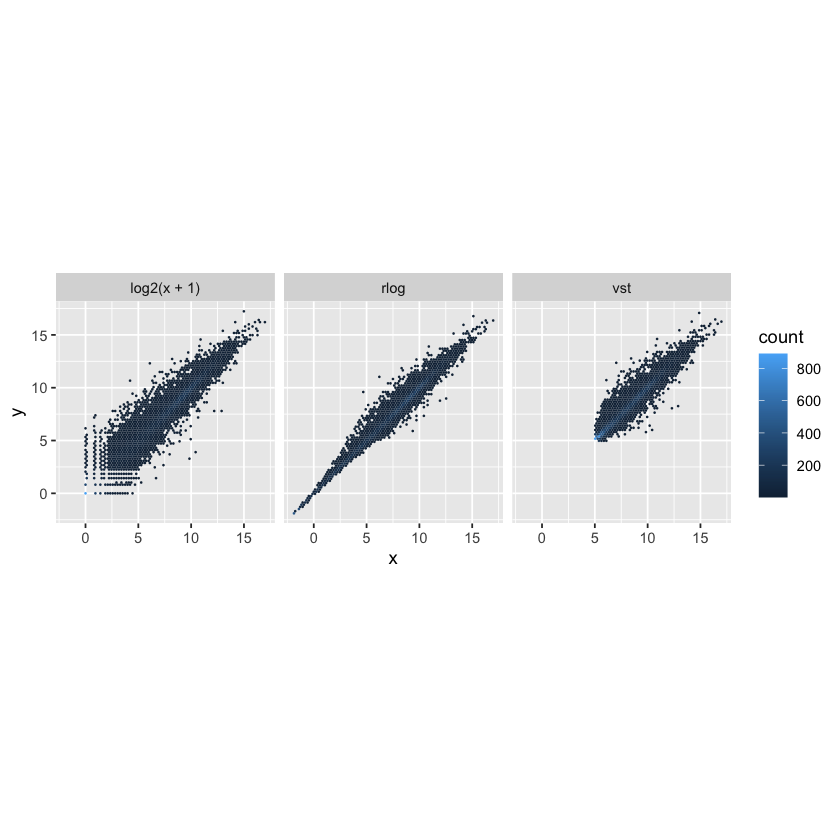

In [25]:
dds <- estimateSizeFactors(dds)

df <- bind_rows(
  as_data_frame(log2(counts(dds, normalized=TRUE)[, 1:2]+1)) %>%
         mutate(transformation = "log2(x + 1)"),
  as_data_frame(assay(vsd)[, 1:2]) %>% mutate(transformation = "vst"),
  as_data_frame(assay(rld)[, 1:2]) %>% mutate(transformation = "rlog"))
  
colnames(df)[1:2] <- c("x", "y")  

ggplot(df, aes(x = x, y = y)) + geom_hex(bins = 80) +
  coord_fixed() + facet_grid( . ~ transformation)  

* **Compute Euclidean sample distances**

> * Transpose dataset & coerce into matrix

In [26]:
sampleDists <- dist(t(assay(vsd)))
sampleDists

          S1_1_2_2  S1_1_2_3  S1_1_2_6  S1_2_2_1  S1_2_2_2  S1_2_2_4  S1_3_2_3
S1_1_2_3  83.25716                                                            
S1_1_2_6  53.15260  69.38574                                                  
S1_2_2_1  56.82031  91.69805  62.62335                                        
S1_2_2_2  44.07732  84.91178  54.55775  48.68160                              
S1_2_2_4  52.55273  95.46285  65.08425  40.10116  50.00112                    
S1_3_2_3  65.92519  92.30361  74.76099  70.71974  71.37113  74.36434          
S1_3_2_4  66.29019 108.14786  87.38791  79.41687  77.48568  77.02886  53.28169
S1_3_2_5  70.94036 104.07063  86.54650  68.39389  73.94791  72.35131  57.16684
          S1_3_2_4
S1_1_2_3          
S1_1_2_6          
S1_2_2_1          
S1_2_2_2          
S1_2_2_4          
S1_3_2_3          
S1_3_2_4          
S1_3_2_5  50.78192

* **Visualize sample distances with heatmap using Euclidean distances**

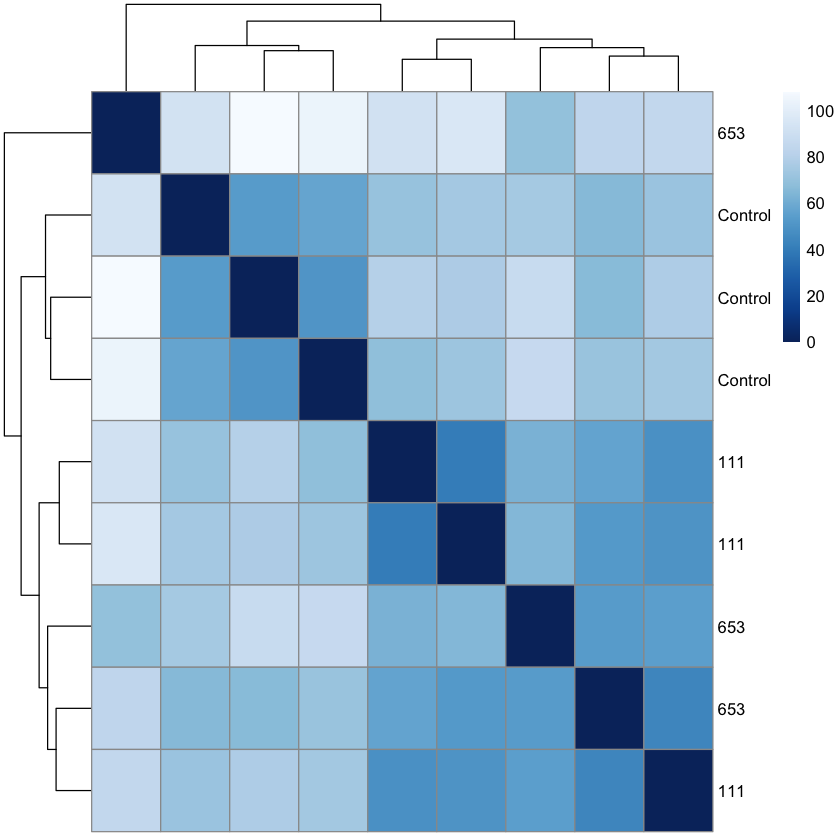

In [27]:
sampleDistMatrix <- as.matrix( sampleDists )
rownames(sampleDistMatrix) <- paste( vsd$group)
colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette(rev(brewer.pal(9, "Blues")))(255)
pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         cluster_rows=T, cluster_cols=T,
         col = colors)

* **Compute Poisson distances (Witten 2011)**

> * Distances

In [28]:
poisd <- PoissonDistance(t(counts(dds)))

* **Visualize sample distances with heatmap using Poisson distances**

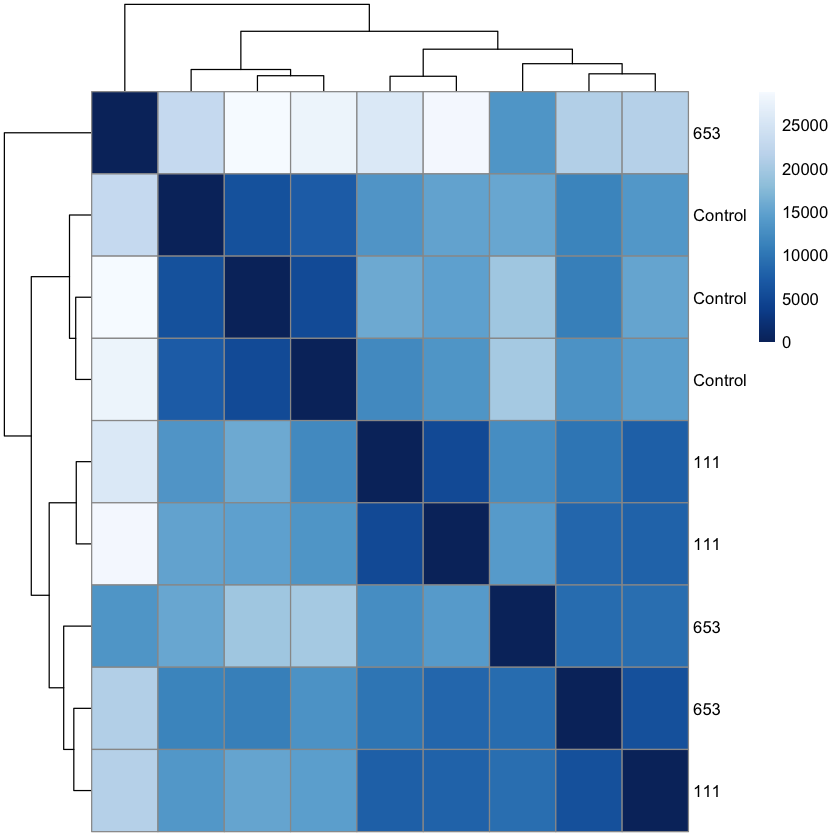

In [29]:
samplePoisDistMatrix <- as.matrix( poisd$dd )
rownames(samplePoisDistMatrix) <- paste( dds$group, sep=" - " )
colnames(samplePoisDistMatrix) <- NULL
pheatmap(samplePoisDistMatrix,
         clustering_distance_rows = poisd$dd,
         clustering_distance_cols = poisd$dd,
         col = colors)

* **Visualize sample-to-sample differences with pricipal components analysis (PCA)**

> * PCA with DESeq2

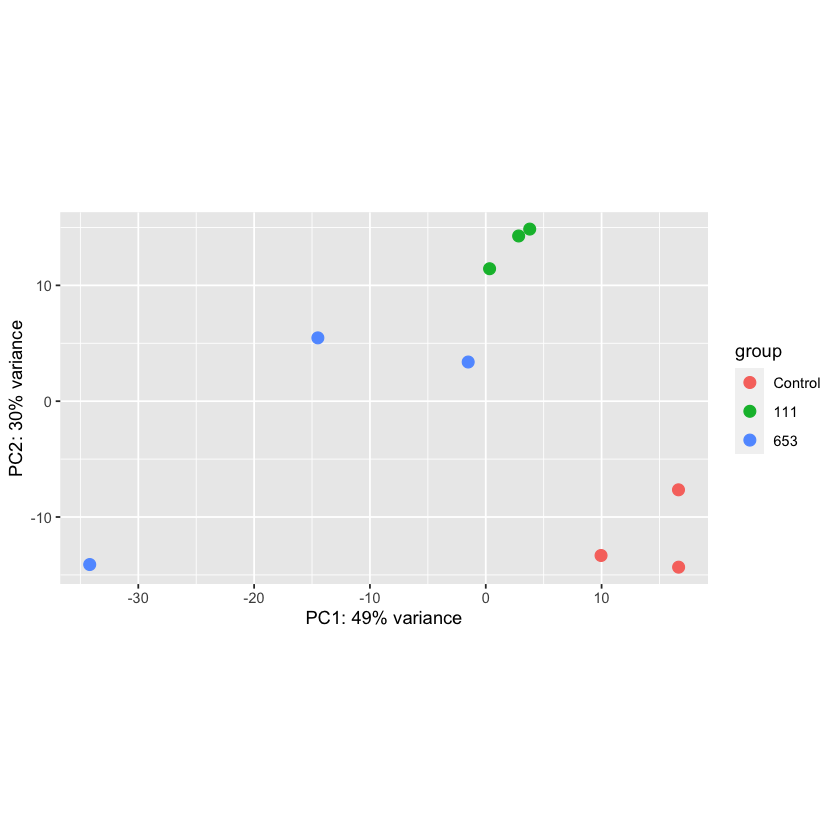

In [30]:
plotPCA(vsd, intgroup = c("group"))

> * PCA with ggplot2

> * View PCs

In [31]:
pcaData <- plotPCA(vsd, intgroup = c( "group"), returnData = TRUE)
pcaData

,PC1,PC2,group,group.1,name
,<dbl>,<dbl>,<fct>,<fct>,<fct>
S1_1_2_2,-1.5173657,3.382563,653,653,S1_1_2_2
S1_1_2_3,-34.1940995,-14.103499,653,653,S1_1_2_3
S1_1_2_6,-14.4970716,5.467213,653,653,S1_1_2_6
S1_2_2_1,2.8395098,14.263987,111,111,S1_2_2_1
S1_2_2_2,0.3302385,11.436265,111,111,S1_2_2_2
S1_2_2_4,3.7951589,14.858210,111,111,S1_2_2_4
S1_3_2_3,9.9531550,-13.322761,Control,Control,S1_3_2_3
S1_3_2_4,16.6505139,-14.330315,Control,Control,S1_3_2_4
S1_3_2_5,16.6399606,-7.651664,Control,Control,S1_3_2_5


> * Express variation explained to percentage

In [32]:
percentVar <- round(100 * attr(pcaData, "percentVar"))

> * Plot data

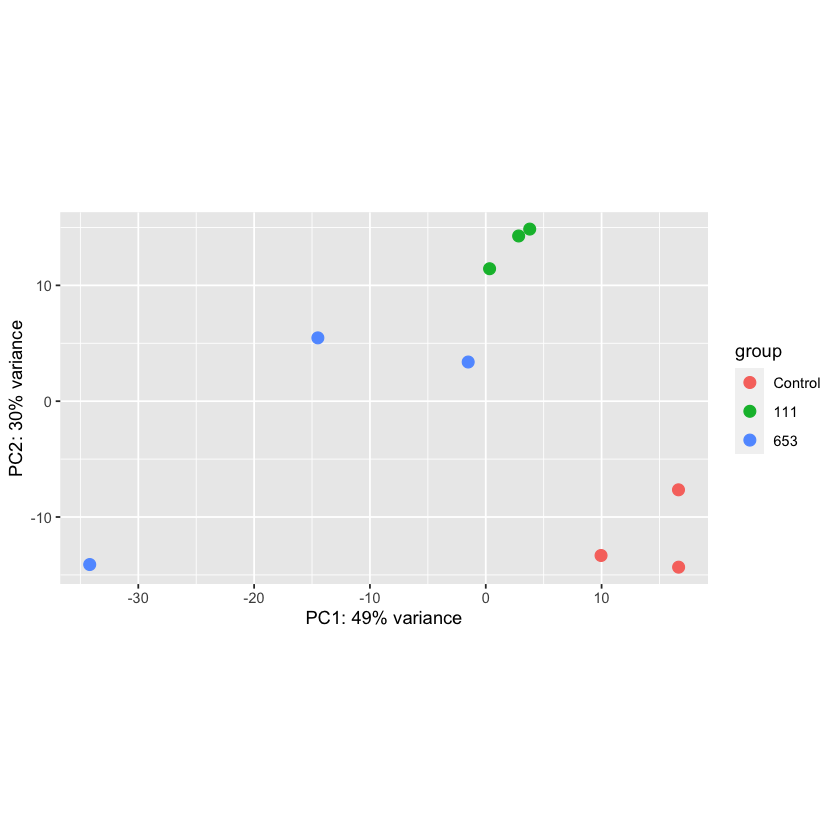

In [33]:
ggplot(pcaData, aes(x = PC1, y = PC2, color = group)) +
  geom_point(size =3) +
  xlab(paste0("PC1: ", percentVar[1], "% variance")) +
  ylab(paste0("PC2: ", percentVar[2], "% variance")) +
  coord_fixed()

* **Visualize sample-to-sample differences with multidimensional scaling (MDS)**

> * VSD data

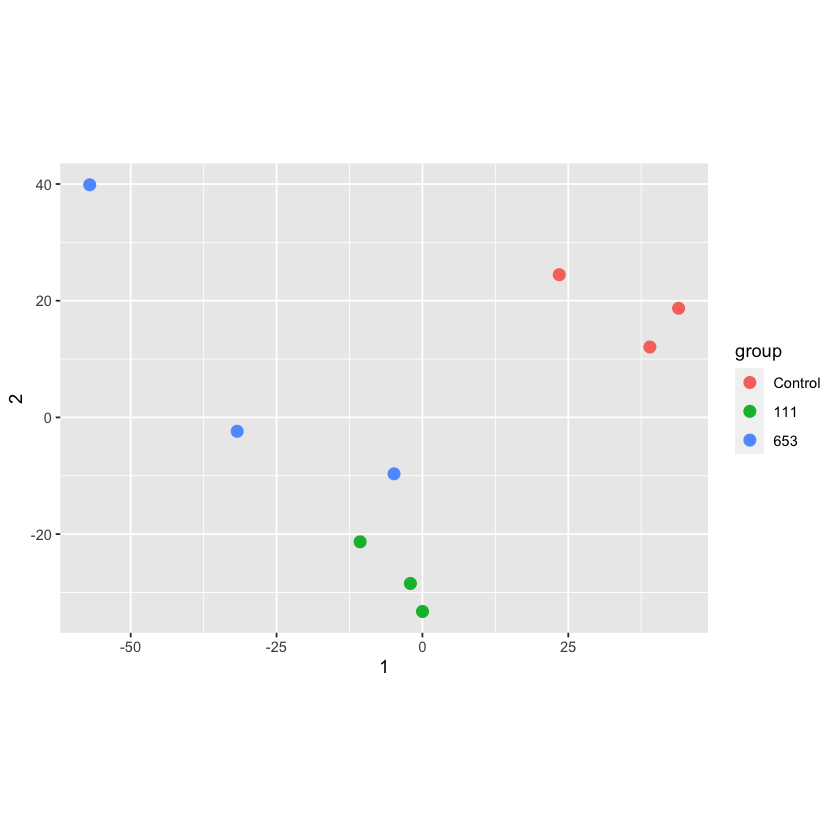

In [34]:
mds <- as.data.frame(colData(vsd))  %>%
         cbind(cmdscale(sampleDistMatrix))
ggplot(mds, aes(x = `1`, y = `2`, color = group)) +
  geom_point(size = 3) + coord_fixed()

> * Poisson data

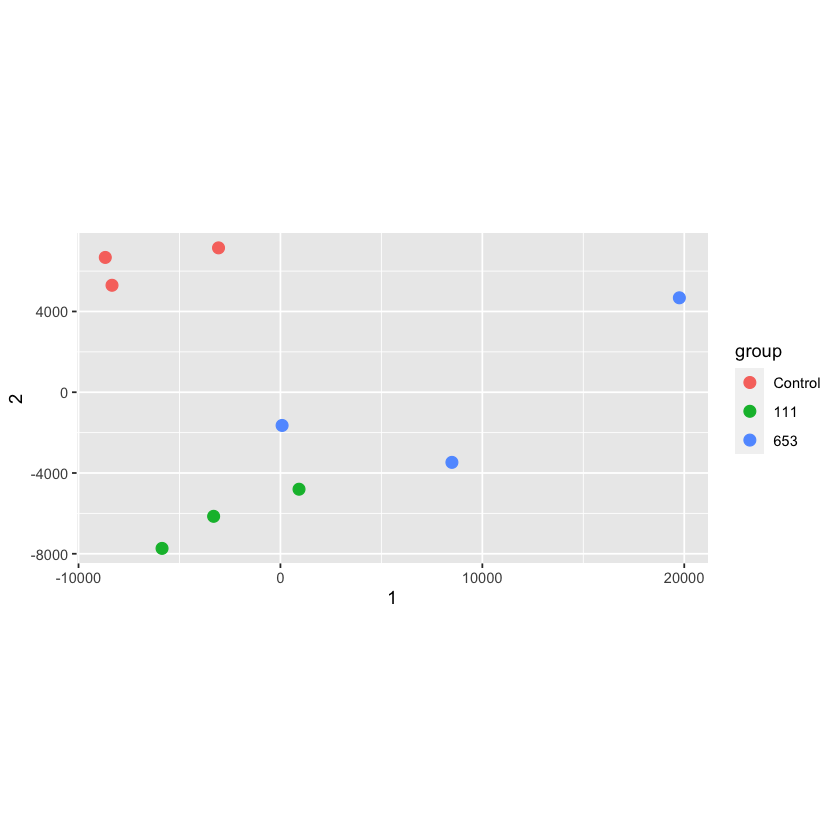

In [35]:
mdsPois <- as.data.frame(colData(dds)) %>%
   cbind(cmdscale(samplePoisDistMatrix))
ggplot(mdsPois, aes(x = `1`, y = `2`, color = group)) +
  geom_point(size = 3) + coord_fixed()

### Diagnostics<a class="anchor" id="nineth-q"></a>  
[Back to Table of Contents](#toc-q)

### Parametric analysis: differential expression analysis<a class="anchor" id="tenth-q"></a>  
[Back to Table of Contents](#toc-q)

* **Identify differentially expressed genes with raw count data**

In [36]:
dds <- DESeq(dds)

using pre-existing size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



* **Tabulate results, set $\alpha = 0.05$**
* **Adjust $p$-values with Benjamini & Hochberg (1995) to account for false discoveries**
* **Shrink/deflate effect sizes (Log fold change estimates)**

> * Contrast control vs 653

In [37]:
Cv653 = results(dds, contrast=c("group","653","Control"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
Cv653 = lfcShrink(dds, contrast=c("group","653","Control"), res=Cv653)

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [38]:
summary(Cv653)


out of 30822 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 764, 2.5%
LFC < 0 (down)     : 987, 3.2%
outliers [1]       : 61, 0.2%
low counts [2]     : 5971, 19%
(mean count < 10)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



> * Contrast control vs 111

In [39]:
Cv111 = results(dds, contrast=c("group","111","Control"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
Cv111 = lfcShrink(dds, contrast=c("group","111","Control"), res=Cv111)

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [40]:
summary(Cv111)


out of 30822 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 310, 1%
LFC < 0 (down)     : 814, 2.6%
outliers [1]       : 61, 0.2%
low counts [2]     : 5971, 19%
(mean count < 10)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



> * Contrast 653 vs 111

In [41]:
i653v111 = results(dds, contrast=c("group","111","653"),
                independentFiltering=TRUE, alpha=0.001, pAdjustMethod="BH", parallel=TRUE)
i653v111 = lfcShrink(dds, contrast=c("group","111","653"), res=i653v111)

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



> * Summary

In [42]:
summary(i653v111)


out of 30822 with nonzero total read count
adjusted p-value < 0.001
LFC > 0 (up)       : 23, 0.075%
LFC < 0 (down)     : 56, 0.18%
outliers [1]       : 61, 0.2%
low counts [2]     : 5971, 19%
(mean count < 10)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



* **Subset gene with > or < log 2 fold change and $q$ value < 0.05 ($p$ value post FDR adjustment)**

> * First define the cutoffs for log2 fold differences and the $q$ value 

In [43]:
log2cutoff = 2
qvaluecutoff = 0.001

> * Concatenate results that are differentially expressed (>log2) and adjusted p-values < $q = 0.05$

In [44]:
diffXGenes <- unique(c(
  rownames(subset(Cv653, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff)),
  rownames(subset(Cv111, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff)),
  rownames(subset(i653v111, padj<=qvaluecutoff & abs(log2FoldChange)>=log2cutoff))))

> * Build assay object

In [45]:
heat <- assay(rld)[diffXGenes,]

* **Isolate genes for each comparison and sort by the log2 fold change estimates**

> * Down-regulated genes

In [46]:
resSig_Cv653 = subset(Cv653, padj < 0.001)# control vs 653

In [47]:
head(resSig_Cv653[ order(resSig_Cv653$log2FoldChange), ])

log2 fold change (MAP): group 653 vs Control 
Wald test p-value: group 653 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean    log2FoldChange             lfcSE
                            <numeric>         <numeric>         <numeric>
PGSC0003DMG400024310 394.973753761557 -3.65852969461097 0.332573857769216
PGSC0003DMG402018475  368.07574234995 -2.92597349214203 0.208489259841739
PGSC0003DMG400006720 46.5737186507738 -2.67388518754251 0.328855107273362
PGSC0003DMG400018141 66.1723191764143 -2.57312116241331 0.336219402025441
PGSC0003DMG400007239 41.1758806403376 -2.51690156126933 0.321557882513197
PGSC0003DMG400008364 15.7940941251711  -2.4795136330375 0.361336665310737
                                  stat               pvalue
                             <numeric>            <numeric>
PGSC0003DMG400024310 -10.7693522362226 4.80368902844748e-27
PGSC0003DMG402018475 -13.9314179300175 4.08170886161225e-44
PGSC0003DMG400006720 -7.73913640035769 1.0009

In [48]:
resSig_Cv111 = subset(Cv111, padj < 0.001)# control vs 111

In [49]:
head(resSig_Cv111[ order(resSig_Cv111$log2FoldChange), ])

log2 fold change (MAP): group 111 vs Control 
Wald test p-value: group 111 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean    log2FoldChange             lfcSE
                            <numeric>         <numeric>         <numeric>
PGSC0003DMG400024310 394.973753761557 -3.02211676597409 0.331077578023494
PGSC0003DMG402018475  368.07574234995 -2.89170925050964 0.207539673054148
PGSC0003DMG400008364 15.7940941251711 -2.76505122400619 0.362201073856748
PGSC0003DMG400019824 241.218272746661 -2.73690780506679 0.334930689465881
PGSC0003DMG400042481 97.2205014293291 -2.73279075111056 0.240892260587279
PGSC0003DMG400029620 537.133339984395 -2.71867224887793 0.257838613093308
                                  stat               pvalue
                             <numeric>            <numeric>
PGSC0003DMG400024310  -8.7626099037387 1.90780958594387e-18
PGSC0003DMG402018475 -13.8413221438806 1.43541865800612e-43
PGSC0003DMG400008364 -6.20142520317411 5.5954

In [50]:
resSig_653v111 = subset(i653v111, padj < 0.001)# 653 vs 111

In [51]:
head(resSig_653v111[ order(resSig_653v111$log2FoldChange), ])

log2 fold change (MAP): group 111 vs 653 
Wald test p-value: group 111 vs 653 
DataFrame with 6 rows and 6 columns
                             baseMean    log2FoldChange             lfcSE
                            <numeric>         <numeric>         <numeric>
PGSC0003DMG400023922 137.335165530658 -2.44470493270839 0.360507482564697
PGSC0003DMG400014293 96.0989153353804 -2.29209964877389 0.360997192685995
PGSC0003DMG400009810 94.1174830804863 -2.22202293989285  0.34618343591106
PGSC0003DMG400026871 104.130367888705 -2.19693807314262  0.33448014628023
PGSC0003DMG400004259 2722.66187316311 -2.12160221441384 0.283060981415698
PGSC0003DMG400020206 49.5430087105347  -2.0605944028854 0.367408323008962
                                  stat               pvalue
                             <numeric>            <numeric>
PGSC0003DMG400023922 -6.51918713399022 7.06894186651574e-11
PGSC0003DMG400014293 -6.16289101348932 7.14286716019018e-10
PGSC0003DMG400009810 -6.29121640471387 3.149878500922

* **Up-regulated genes**

In [52]:
head(resSig_Cv653[ order(resSig_Cv653$log2FoldChange, decreasing = TRUE), ])# control vs 653

log2 fold change (MAP): group 653 vs Control 
Wald test p-value: group 653 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean   log2FoldChange             lfcSE
                            <numeric>        <numeric>         <numeric>
PGSC0003DMG400001550 949.125346832867 2.75671478511216 0.314990428654472
PGSC0003DMG402007970 173.217455759919 2.62484283087561 0.333274099934194
PGSC0003DMG400003056 1156.52933338466 2.48987743504705 0.328238520882244
PGSC0003DMG400023922 137.335165530658 2.37966607349235 0.361377606722848
PGSC0003DMG400020206 49.5430087105347 2.17970766442279 0.367587095261493
PGSC0003DMG400003044 2383.98606269413 2.17017706995068 0.361626168789111
                                 stat               pvalue                 padj
                            <numeric>            <numeric>            <numeric>
PGSC0003DMG400001550 8.80027677119565   1.364791382516e-18 1.20832779902041e-15
PGSC0003DMG402007970 7.98905661745851 1.3597524120810

In [53]:
head(resSig_Cv111[ order(resSig_Cv111$log2FoldChange, decreasing = TRUE), ])# control vs 111

log2 fold change (MAP): group 111 vs Control 
Wald test p-value: group 111 vs Control 
DataFrame with 6 rows and 6 columns
                             baseMean   log2FoldChange             lfcSE
                            <numeric>        <numeric>         <numeric>
PGSC0003DMG402007970 173.217455759919 2.15242409842511 0.333509909876157
PGSC0003DMG400020844 941.876378150288 2.15124501913794 0.254791092865951
PGSC0003DMG400002821 158.481949855994 2.05047268749897 0.290903566046882
PGSC0003DMG400016462 180.215101453399 2.01931923414929 0.317455625308344
PGSC0003DMG402002270 72.2067055769436 2.00530007921004 0.270642513505547
PGSC0003DMG400003229 565.278212344986 1.99917863814251 0.181356191638668
                                 stat               pvalue                 padj
                            <numeric>            <numeric>            <numeric>
PGSC0003DMG402007970 6.73352840019558 1.65597319845101e-11 2.53404787590126e-09
PGSC0003DMG400020844 8.46666571811119 2.5251746481353

In [54]:
head(resSig_653v111[ order(resSig_653v111$log2FoldChange, decreasing = TRUE), ])# 653 vs 111

log2 fold change (MAP): group 111 vs 653 
Wald test p-value: group 111 vs 653 
DataFrame with 6 rows and 6 columns
                             baseMean   log2FoldChange             lfcSE
                            <numeric>        <numeric>         <numeric>
Novel01306           50.6001621397357 1.93707493978414 0.366515520578127
PGSC0003DMG401029257 41.5102726205131 1.80394680035697 0.343014001891798
PGSC0003DMG400001178 41.4389850595431 1.78309341646236 0.366520449457771
PGSC0003DMG400011406 152.708478811671 1.73701527782534 0.310271348622193
PGSC0003DMG400020999 11069.2287712297 1.65101154545396 0.312279409543216
PGSC0003DMG400004735 981.545131645913 1.57552948600685 0.236195421217925
                                 stat               pvalue                 padj
                            <numeric>            <numeric>            <numeric>
Novel01306           5.37986369087563 7.45422580108239e-08 7.31870026051907e-05
PGSC0003DMG401029257 5.11043750396786 3.21413623649128e-07 0.

**Build Table of DEGs**

Bind all DEGs from each comparisons, by rows

In [55]:
DEGs=rbind(c(resSig_Cv653@rownames,
             resSig_Cv111@rownames,
             resSig_653v111@rownames))

IDs

In [56]:
ID=rep(c("Cv653", "Cv111", "653v111"),
               c(length(resSig_Cv653@rownames),
                length(resSig_Cv111@rownames),
                length(resSig_653v111@rownames)))

Bind DEGs and IDs by column

In [57]:
DEGS=data.frame(as.character(DEGs),ID)

Rename Columns

In [58]:
colnames(DEGS) = c("Gene_ID","Comparison") 

Sanity Checks

In [59]:
length(DEGS$Gene_ID)==length(ID)

[1] TRUE

In [60]:
length(resSig_Cv653@rownames)

[1] 1751

In [61]:
length(resSig_Cv111@rownames)

[1] 1124

In [62]:
length(resSig_653v111@rownames)

[1] 79

In [63]:
length(DEGS$Gene_ID) == length(resSig_Cv653@rownames)+length(resSig_Cv111@rownames)+length(resSig_653v111@rownames)

[1] TRUE

Write data into table

In [64]:
write.csv(DEGS, 
          file="Solanum_DEGs.csv")

**Merge Gene names with DEGs**

Create column with rownames

In [64]:
Cv653$id <- rownames(Cv653)
Cv111$id <- rownames(Cv111)
i653v111$id <- rownames(i653v111)

Merge data tables

In [65]:
Cv653_GeneNames <- merge(as(Cv653,"data.frame"), gnDF, by="id")
Cv111_GeneNames <- merge(as(Cv111,"data.frame"), gnDF, by="id")
i653v111_GeneNames <- merge(as(i653v111,"data.frame"), gnDF, by="id")

Check for unique genes between two datasets

In [66]:
diffXGenes[!(diffXGenes %in% DEGS$Gene_ID)]

character(0)

### Visualization<a class="anchor" id="eleventh-q"></a>  
[Back to Table of Contents](#toc-q)

**MA plot**

> * Control vs. 653

In [71]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES")

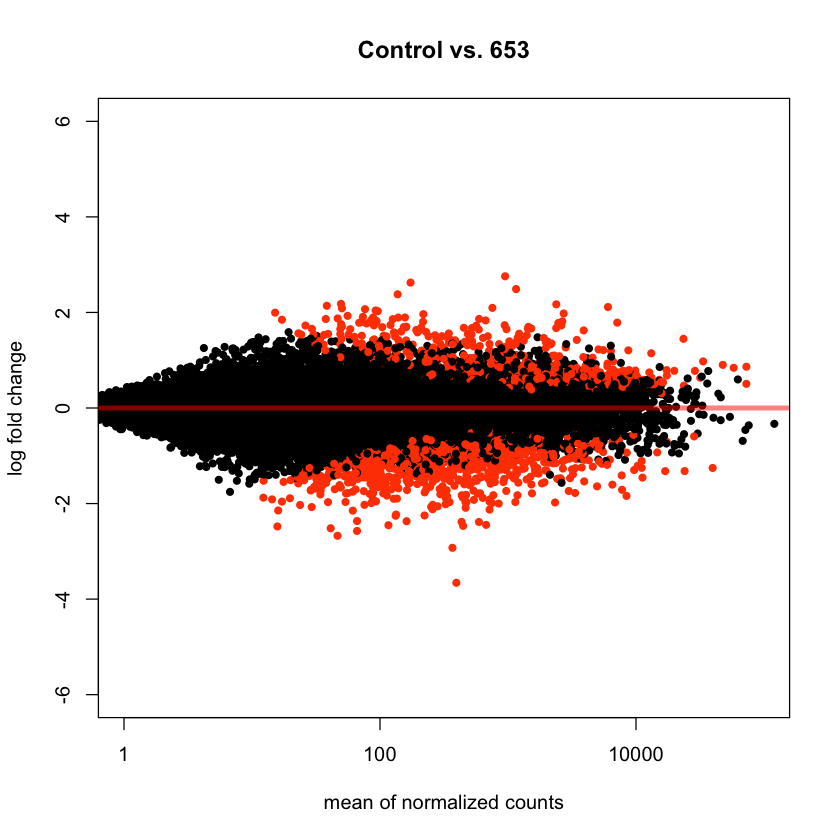

In [62]:
#tiff("Potato_MA-P_Cv653.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(Cv653, 
                  xlim=xlim, ylim=ylim,
                  cex=0.9, alpha = 0.001,
                  main="Control vs. 653",
                  colNonSig="black",colSig="orangered1")
#dev.off()

> * 111 vs control

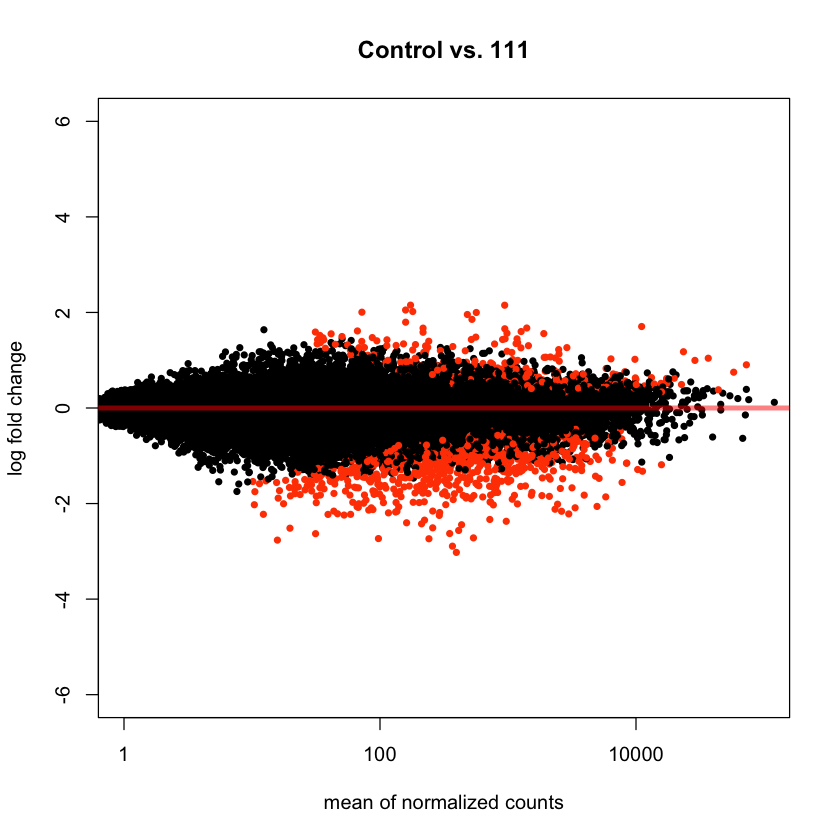

In [63]:
#tiff("Potato_MA-P_Cv111.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(Cv111,
                xlim=xlim, ylim=ylim,
                cex=0.8, alpha = 0.001,
                main="Control vs. 111",
                colNonSig="black",colSig="orangered1")
#dev.off()

> * 111 vs. 653

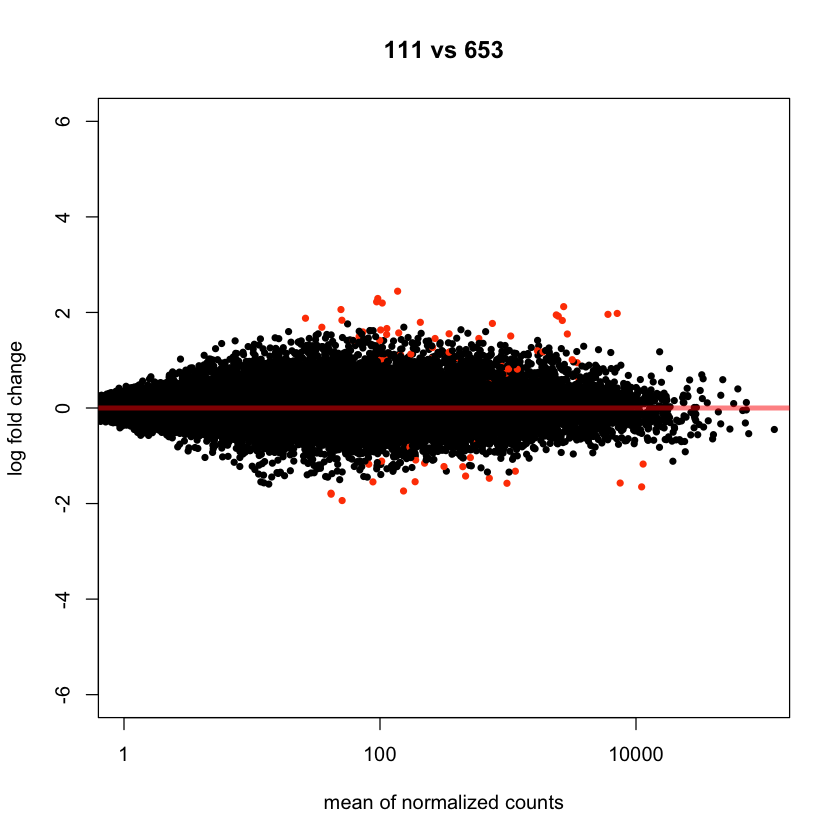

In [66]:
#tiff("Potato_MA-P_111v653.tiff", width=5, height=5, units='in', res=300)
xlim <- c(1,1e5); ylim <- c(-6,6)
DESeq2::plotMA(i653v111,
                xlim=xlim, ylim=ylim,
                cex=0.8, alpha = 0.001,
                main="111 vs 653",
                colNonSig="black",colSig="orangered1")
#dev.off()

**Histograms of $p$-values**

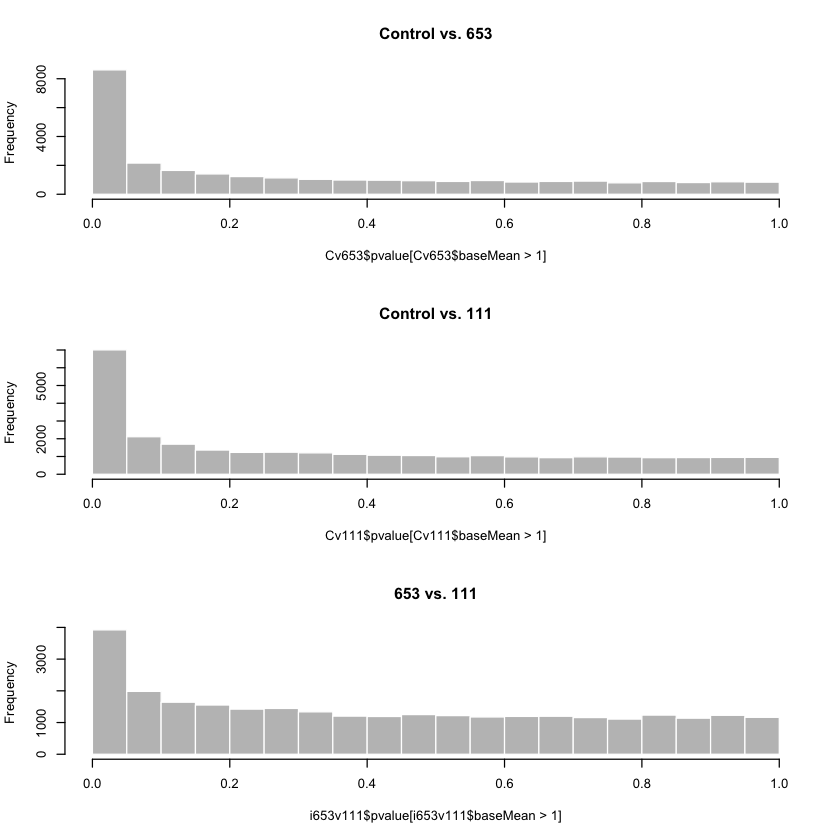

In [67]:
par(mfrow=c(3,1))
hist(Cv653$pvalue[Cv653$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "Control vs. 653")
hist(Cv111$pvalue[Cv111$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "Control vs. 111")
hist(i653v111$pvalue[i653v111$baseMean > 1], breaks = 0:20/20,
     col = "grey75", border = "white", main = "653 vs. 111")

**Volcano plots**

> * 653 vs control

In [67]:
Cv653_gn = subset(Cv653_GeneNames, Comparison == "Cv653")

- Order genes by fold change values

In [68]:
Cv653_gn = (Cv653_gn[order(-abs(Cv653_gn$log2FoldChange)),])

Convert 10 DEG gene names from factors to vectors

In [69]:
labs = head(Cv653_gn$Hit1_acc, n=20)
lab = as.character(labs)
lab
labels=c('-','ABAH1_ARATH','PRS2_SOLTU','-','-','C71A4_SOLME','DOT3_ARATH',
         'IER1_SOLLC','Y1627_STAS1','BAM3_ARATH','MPCP1_ARATH','5EAS2_NICAT','Y5986_ARATH','SNL6_ORYSJ',
         'PR04_SOLLC','CCA1_ARATH','TECR_DICDI','-','TYDC1_PAPSO','C7D55_HYOMU')

[1] "-"           "ABAH1_ARATH" "PRS2_SOLTU"  "-"           "-"          
 [6] "C71A4_SOLME" "DOT3_ARATH"  "IER1_SOLLC"  "Y1627_STAS1" "BAM3_ARATH" 
[11] "MPCP1_ARATH" "5EAS2_NICAT" "Y5986_ARATH" "SNL6_ORYSJ"  "PR04_SOLLC" 
[16] "CCA1_ARATH"  "TECR_DICDI"  "-"           "TYDC1_PAPSO" "C7D55_HYOMU"

Warning message in EnhancedVolcano(Cv653_GeneNames, lab = NA, x = "log2FoldChange", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(Cv653_GeneNames, lab = NA, x = "log2FoldChange", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



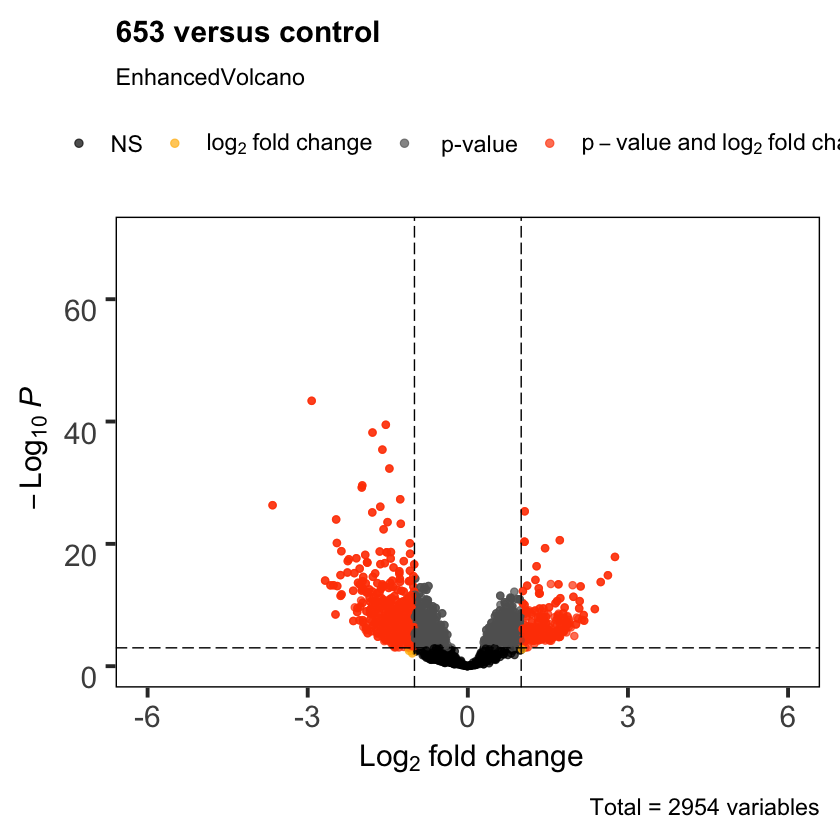

In [72]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/Potato_VP_Cv653.tiff",
#     width=10, height=10, units='in', res=300)

Cv6=EnhancedVolcano(Cv653_GeneNames,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "653 versus control",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.7,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,          
    xlim = c(-6, 6),
    ylim = c(0, 70),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))

Cv6 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

# dev.off()

In [71]:
setwd("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/")

In [79]:
tiff("Potato_VP_Cv653.tiff", width=10, height=10, units='in', res=300)
Cv6
dev.off()

pdf 
  2

> * 111 vs control

Warning message in EnhancedVolcano(Cv111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(Cv111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



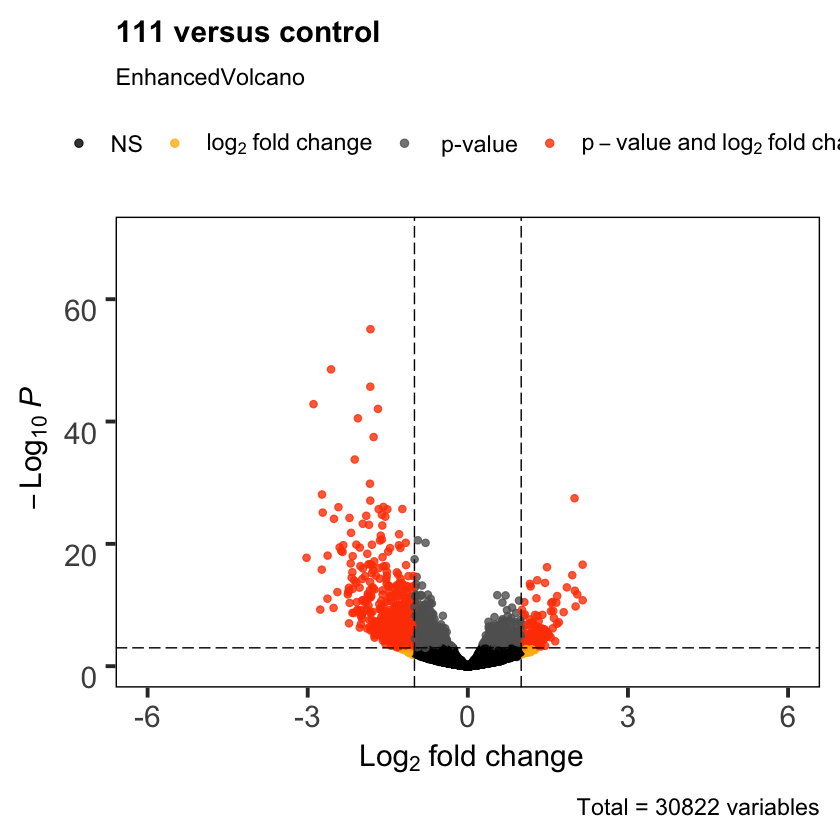

In [73]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/Potato_VP_Cv111.tiff",
#  width=10, height=10, units='in', res=300)

Cv1=EnhancedVolcano(Cv111,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "111 versus control",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.8,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,
    xlim = c(-6, 6),
    ylim = c(0, 70),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))
Cv1 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

# dev.off()

> * 653 vs. 111

Warning message in EnhancedVolcano(i653v111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptPointSize argument deprecated in v1.4 - please use pointSize”
Warning message in EnhancedVolcano(i653v111, lab = NA, x = "log2FoldChange", y = "pvalue", :
“transcriptLabSize argument deprecated in v1.4 - please use labSize”
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



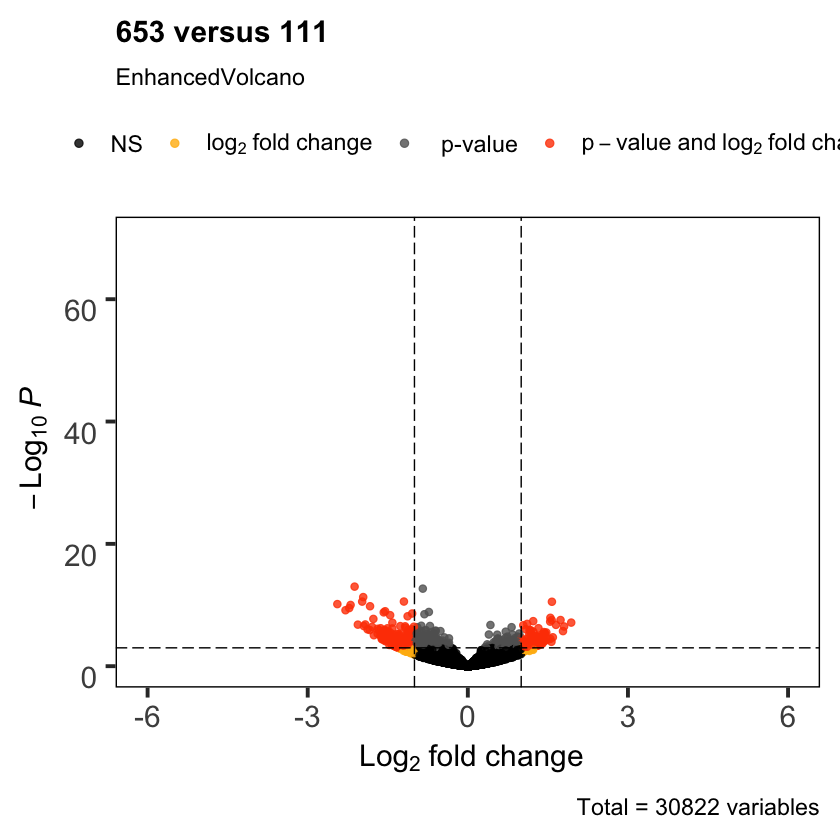

In [75]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/Potato_VP_653v111.tiff",
#      width=10, height=10, units='in', res=300)

i6vi1=EnhancedVolcano(i653v111,
    lab = NA,
    x = 'log2FoldChange',
    y = 'pvalue',
    title = "653 versus 111",
    legend=c("NS","Log2 fold-change","p-value",
    "p-value & Log2 fold-change"),
    legendPosition = "top",
    legendLabSize = 14,
    legendIconSize = 2.0,
    pCutoff = 0.001,
    FCcutoff = 1.0,
    transcriptPointSize = 1.75,
    transcriptLabSize = 3.0,
    colAlpha = 0.8,
    border = "full",
    gridlines.major = FALSE,
    gridlines.minor = FALSE,
    xlim = c(-6, 6),
    ylim = c(0, 70),
    col=c("black", "darkgoldenrod1", "gray38", "orangered1"))
i6vi1 + scale_color_manual(
  values=c(
    NS="black",
    FC="darkgoldenrod1",
    P="gray38",
    FC_P="orangered1"),
  labels=c(
    NS='NS',
    FC=expression(log[2]~fold~change),
    P="p-value",
    FC_P=expression(p-value~and~log[2]~fold~change)))

# dev.off()

Where is the biggest change?

In [76]:
max(abs(Cv653_GeneNames$log2FoldChange))
max(abs(Cv111_GeneNames$log2FoldChange))
max(abs(i653v111_GeneNames$log2FoldChange))

[1] 3.65853

[1] 3.022117

[1] 2.444705

**Cluster Genes**

Heatmap I

Are there any duplicate genes?

In [158]:
table_all[,7][duplicated(table_all[,7])]

[1] "PGSC0003DMG402007970" "PGSC0003DMG402018475" "PGSC0003DMG400024310"
[4] "PGSC0003DMG400023922"

Number of unique genes

In [159]:
length(unique(table_all[,7]))

[1] 26

Remove duplicate genes

In [160]:
degs = table_all[!duplicated(table_all[,7]),]

Object for heatmap

In [161]:
heat <- assay(vsd)[degs[,7],]

Convert to dataframe

In [162]:
hmDF = data.frame(heat)

Confirm order

In [163]:
rownames(hmDF) == degs[,7]

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

Find indices of unknown genes

In [164]:
rownames(hmDF)[which(degs[,6] == "-")]

[1] "PGSC0003DMG402007970" "PGSC0003DMG400006720" "PGSC0003DMG400024310"
[4] "PGSC0003DMG400020844" "PGSC0003DMG400002821" "PGSC0003DMG401029257"

Replace dashes with mRNA names

- Index objects

In [166]:
Index = degs[,6] == "-"

- Convert to character to solve NA problem

In [167]:
degs[,6] = as.character(degs[,6])

- Replace NAs with fragment names

In [168]:
degs[,6][Index] = rownames(hmDF)[Index]

Replace rownames in heatmap object with gene names

- Delete duplicate genes

In [170]:
length(unique(degs[,6])) == length(degs[,6])

[1] FALSE

In [171]:
hmDF = hmDF[-which(duplicated(degs[,6])),]

In [172]:
degs = degs[-which(duplicated(degs[,6])),6]

Replace fragment names with gene names

- Confirm order

In [173]:
rownames(hmDF) = degs

Reorder genes/rows

In [180]:
ord_row_labs = rownames(hmDF)[(Potato_DEGs$tree_row$order)]

In [181]:
row_labs = cat(paste0('"', paste(ord_row_labs, collapse="\", \""), '"'))

"CHSB_SOLTU", "WRK40_ARATH", "ABAH1_ARATH", "PGSC0003DMG400024310", "ODBA2_ARATH", "PGSC0003DMG401029257", "TIF5A_ARATH", "EDL3_ARATH", "C71A4_SOLME", "DOT3_ARATH", "PGSC0003DMG400006720", "PR04_SOLLC", "C7D55_HYOMU", "WRK75_ARATH", "LTI65_ARATH", "PGSC0003DMG402007970", "PGSC0003DMG400002821", "RBCX1_ARATH", "NUDT8_ARATH", "GRXS9_ARATH", "LOX12_SOLTU", "PRR1_TOBAC", "PGSC0003DMG400020844", "PRS2_SOLTU", "IER1_SOLLC"

Reorder samples/columns

In [174]:
names(hmDF)

[1] "S1_1_2_2" "S1_1_2_3" "S1_1_2_6" "S1_2_2_1" "S1_2_2_2" "S1_2_2_4" "S1_3_2_3"
[8] "S1_3_2_4" "S1_3_2_5"

In [175]:
hmDF <- hmDF[c(7:9,1:3,4:6)]

In [ ]:
names(hmDF)

Italicize names

In [177]:
newnames <- lapply(
  rownames(hmDF),
  function(x) bquote(italic(.(x))))

Heatmap

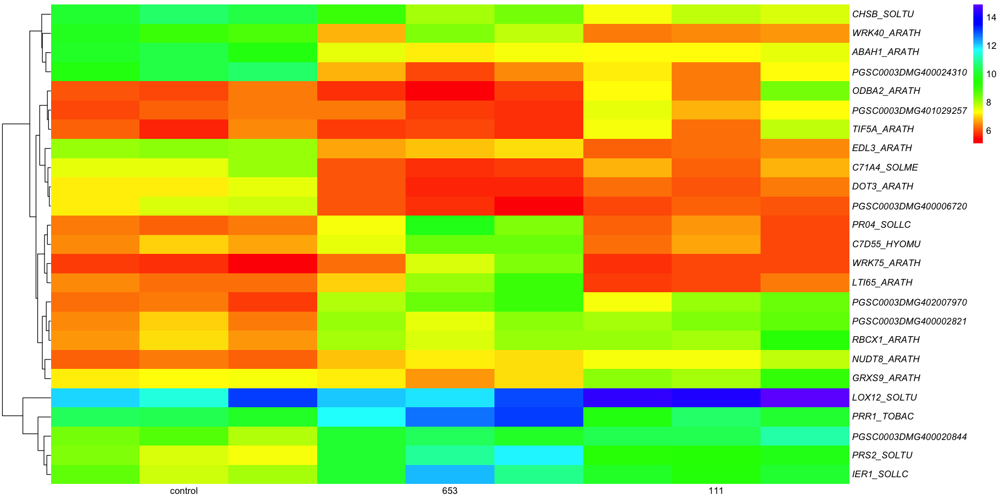

In [178]:
options(repr.plot.width=15, repr.plot.height=7.5)
Potato_DEGs=pheatmap(hmDF,
  color= (rainbow(96,start=0.0,end=0.74,alpha=1)),
  border_color = NA,
  cluster_cols=F,                   
  show_colnames = TRUE,
  show_rownames = TRUE,
  labels_col=paste0(c(" ","control"," ","","653"," ", "","111"," ")),
  angle_col=0,
  labels_row = as.expression(newnames))

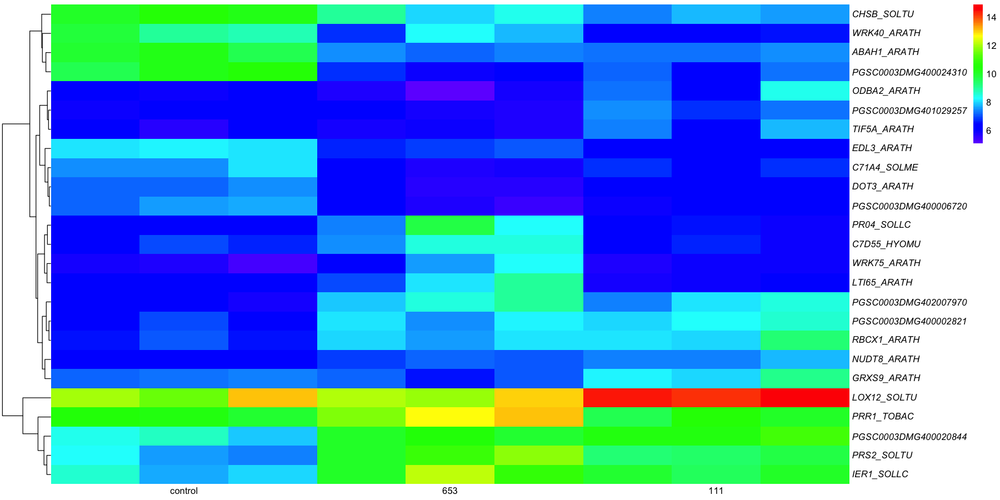

In [179]:
options(repr.plot.width=15, repr.plot.height=7.5)
Potato_DEGs=pheatmap(hmDF,
        color= rev(rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        cluster_cols=F,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c(" ","control"," ","","653"," ", "","111"," ")),
        angle_col=0,
        labels_row = as.expression(newnames))

In [183]:
tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/Potato_HeatMap_1.tiff",
     width = 8, height =5, units = 'in', res = 300)
Potato_DEGs
dev.off()

pdf 
  2

Heatmap II

In [72]:
heat <- assay(vsd)[diffXGenes,]

Convert to dataframe

In [73]:
hmDF = data.frame(heat)

Extract subset of genenames that are differentially expressed

* First, make new column of character gene IDs

In [74]:
gnDF["ID"] = as.character(gnDF$id)

* Differentially expressed genes

In [75]:
degs = subset(gnDF, gnDF$ID %in% rownames(hmDF))

* Use only unique/non duplicated rows

In [76]:
degs = degs[!duplicated(degs$ID),]

* Sanity checks

In [77]:
length(degs$ID) == length(rownames(hmDF))

[1] TRUE

In [78]:
class(degs$ID) == class(rownames(hmDF))

[1] TRUE

* Reorder rows of both dataframes to align with each other

In [79]:
hmDF <- hmDF[with(hmDF, order(rownames(hmDF))), ]

In [80]:
degs <- degs[with(degs, order(degs$ID)), ]

* Sanity check

In [81]:
rownames(hmDF) == degs$ID

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

Convert dataframe to matrix

In [82]:
hmdf = as.matrix(hmDF)

Replace rownames in heatmap object with gene names

In [83]:
rownames(hmdf) <- degs$Hit1_acc

Order row labels to italicize

In [85]:
ord_row_labs = rownames(hmdf)[(Tater_DEGs$tree_row$order)]

In [86]:
ord_row_labs = cat(paste0('"', paste(ord_row_labs, collapse="\", \""), '"'))

"RCA1_TOBAC", "NIA_SOLLC", "GAPN_NICPL", "HSP11_SOLPE", "NIR_BETPN", "LNK1_ARATH", "-", "FAD2_VERFO", "PRS2_SOLTU", "IER1_SOLLC", "NLTP2_SOLLC", "OS13_SOLCO", "PRR1_TOBAC", "C7A52_PANGI", "Y1627_STAS1", "FAD4_ARATH", "-", "ACCH3_SOLLC", "TPSGB_SOLHA", "ERF26_ARATH", "-", "UGT7_CATRO", "MIK2_ARATH", "TECR_DICDI", "C71A4_SOLME", "RUP2_ARATH", "4CLLA_ARATH", "-", "DOT3_ARATH", "-", "EDL3_ARATH", "UGT7_CATRO", "MYB3_ARATH", "C7D55_HYOMU", "-", "TYDC1_PAPSO", "-", "BT1_ARATH", "PER21_ARATH", "TPS32_SOLLC", "WRK75_ARATH", "LTI65_ARATH", "FAD12_PUNGR", "PR04_SOLLC", "C7D55_HYOMU", "C7D55_HYOMU", "PCL1_ARATH", "NUDT8_ARATH", "-", "-", "RBCX1_ARATH", "CYSG_PSEA7", "ASD_ARATH", "FLS_SOLTU", "Y1773_CYTH3", "UFAA1_MYCTU", "F3PH_PETHY", "CFI3_ARATH", "CHSB_SOLTU", "5EAS2_NICAT", "Y5986_ARATH", "WDL4_ARATH", "BAM3_ARATH", "-", "SHGR9_ARATH", "NCS1_PAPSO", "SNL6_ORYSJ", "ABAH1_ARATH", "AAE_RAUSE", "PHOT2_ARATH", "TPS3_SOLLC", "RM16_PETHY", "LOVG_DROME", "HEBP2_HUMAN", "ACMAT_VITLA", "TYDC1_PAPSO", "H

- Italicize row names

In [87]:
newnames <- lapply(
  rownames(hmdf),
  function(x) bquote(italic(.(x))))

Visualize heatmap

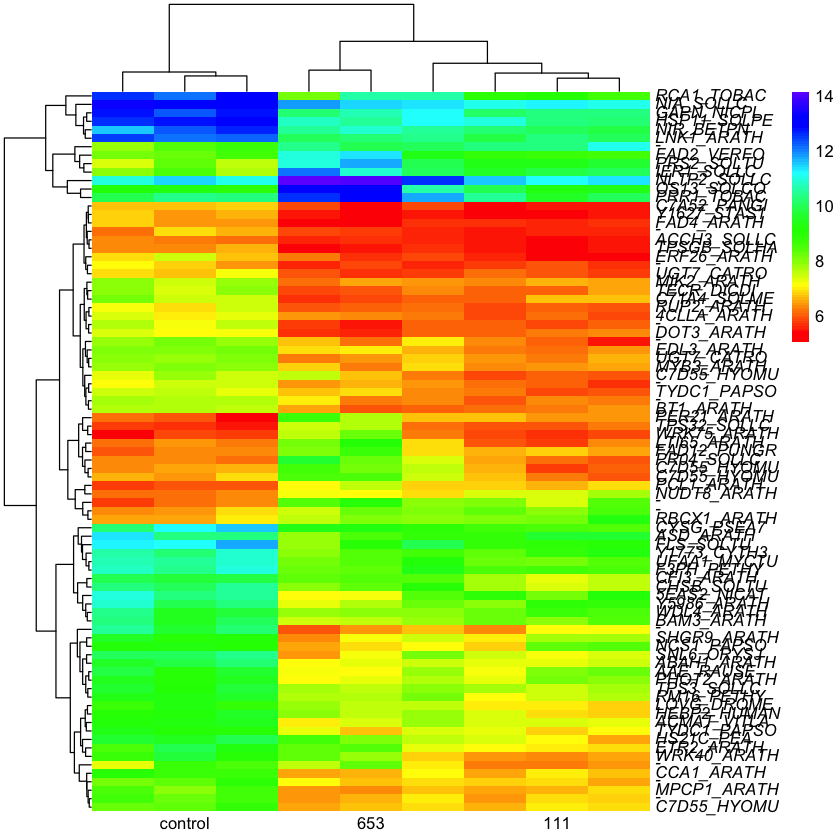

In [94]:
Tater_DEGs=pheatmap(hmdf,
        color= (rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c(" ", " ","653", "111"," "," ", "control"," "," ")),
        angle_col=0,
        labels_row = as.expression(newnames))


In [95]:
setwd('/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/')

In [96]:
tiff("Potato_HeatMap_1.tiff", width = 5, height =10, units = 'in', res = 300)
Tater_DEGs
dev.off()

pdf 
  2

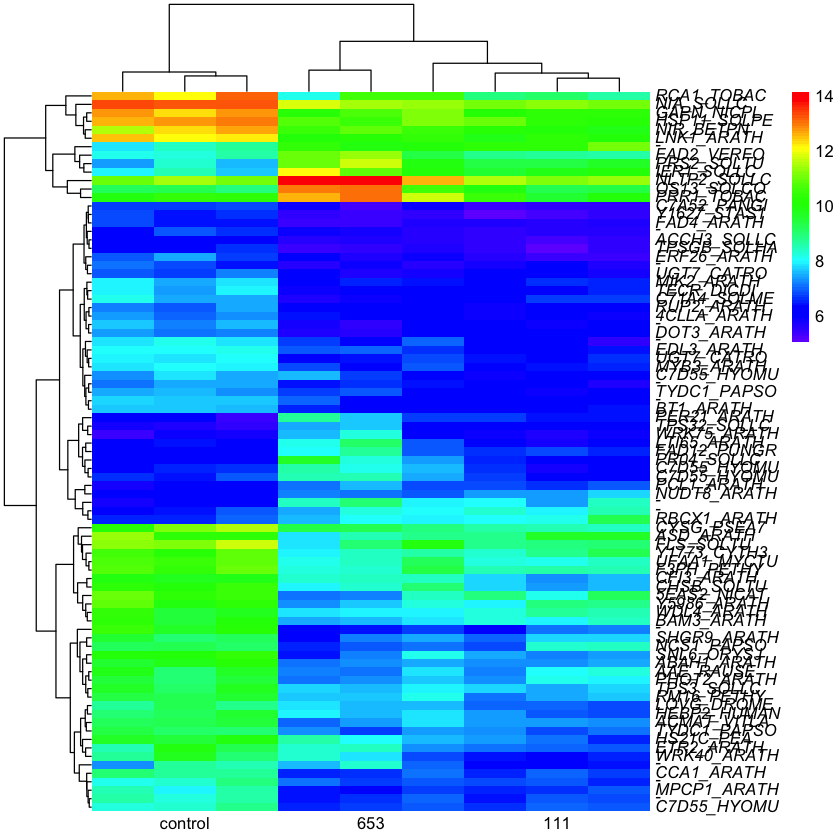

In [92]:
Tater_DEGs=pheatmap(hmdf,
        color= rev(rainbow(96,start=0.0,end=0.74,alpha=1)),#,s=1,v=0.6,start=0.5,end=0.01),
        border_color = NA,
        show_colnames = TRUE,
        show_rownames = TRUE,
        labels_col=paste0(c(" ", " ","653", "111"," "," ", "control"," "," ")),
        angle_col=0,
        labels_row = as.expression(newnames))

In [93]:
tiff("Potato_HeatMap_2.tiff", width = 5, height =10, units = 'in', res = 300)
Tater_DEGs
dev.off()

pdf 
  2

**Venn Diagram**

Control vs 653

In [67]:
resSig_Cv653 = subset(Cv653, padj < 0.001)
resSig_Cv653_fragments = row.names(resSig_Cv653)

Control vs 111

In [68]:
resSig_Cv111 = subset(Cv111, padj < 0.001)
resSig_Cv111_fragments = row.names(resSig_Cv111)

653 vs 111

In [69]:
resSig_653v111 = subset(i653v111, padj < 0.001)
resSig_653v111_fragments = row.names(resSig_653v111)

Build common dataframe

In [70]:
vdDF = c(resSig_Cv653_fragments,
         resSig_Cv111_fragments,
        resSig_653v111_fragments)

Compare

In [71]:
resSig_Cv653_fragments.2 <- vdDF %in% resSig_Cv653_fragments
resSig_Cv111_fragments.2 <- vdDF %in% resSig_Cv111_fragments
resSig_653v111_fragments.2 <- vdDF %in% resSig_653v111_fragments

Compute venn diagram counts

In [72]:
counts = cbind(resSig_Cv653_fragments.2, resSig_Cv111_fragments.2, resSig_653v111_fragments.2)
vdcounts = vennCounts(counts)

Plot-this is incorrect!

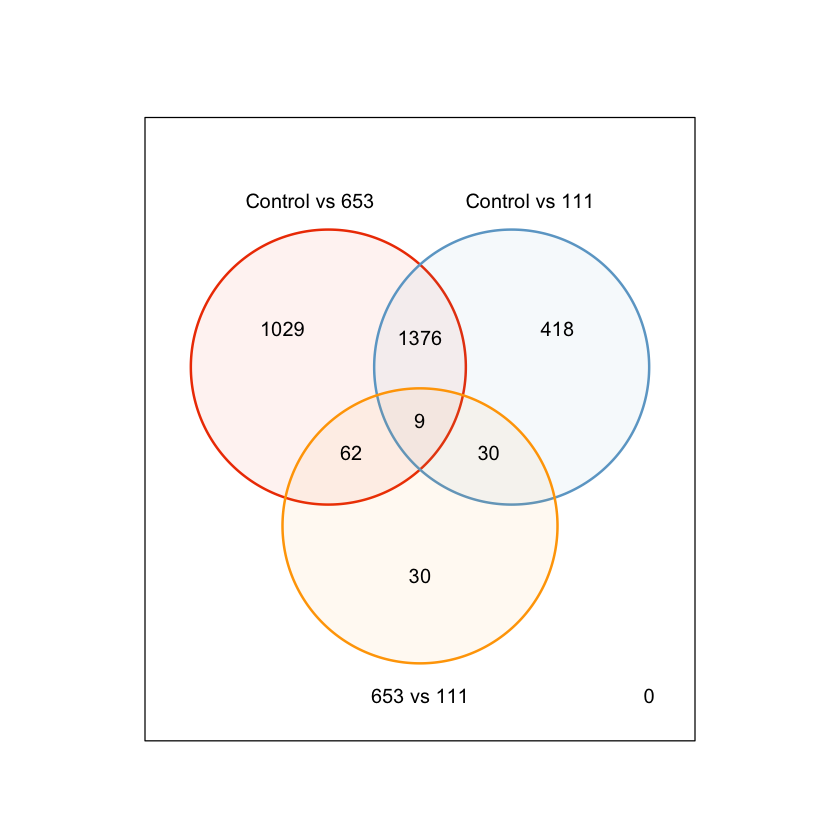

In [73]:
# tiff("Potato_VD.tiff", width=5, height=5, units = 'in', res = 300)
vennDiagram(vdcounts,
            cex=1,
            lwd=2,
            names=c("Control vs 653","Control vs 111","653 vs 111"),
            circle.col = c("orangered2","skyblue3","orange1"))

# dev.off()

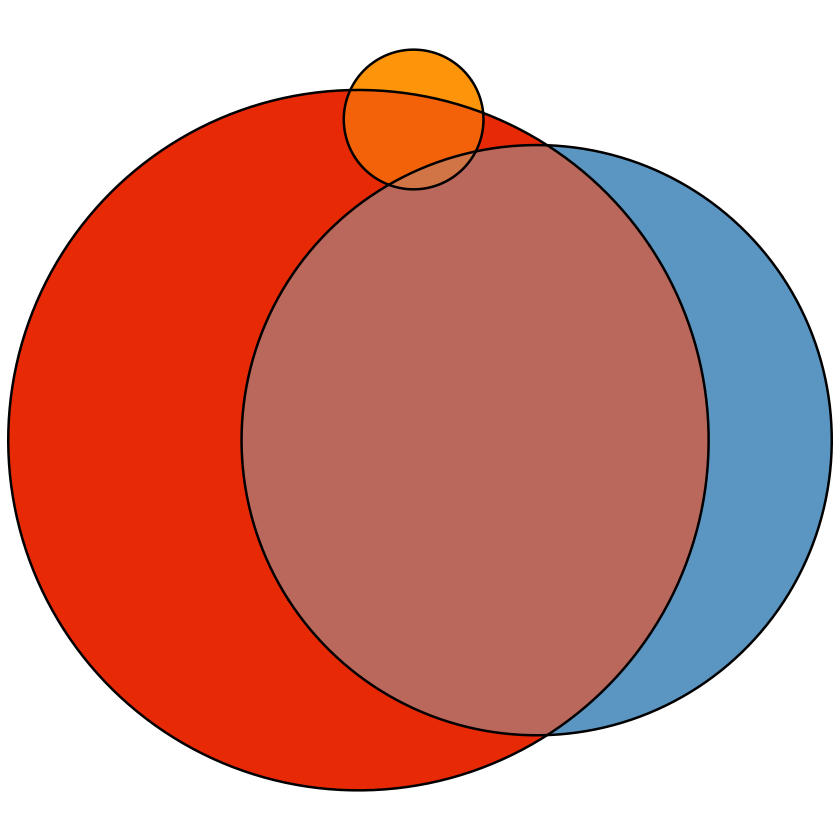

In [74]:
# tiff("Potato_VD-2.tiff", width=5, height=5, units = 'in', res = 300)
VD = euler(c(A=1092, B=418, C=30,
            "A&B"=1376, "A&C"=62, "B&C"=30,
            "A&B&C"=9))
plot(VD,
     fills = c("orangered2","skyblue3","orange1"),
     lwd=2,cex=1,
     labels = NULL
     )
options(repr.plot.width=15, repr.plot.height=15)
# dev.off()

Venn diagram for publication

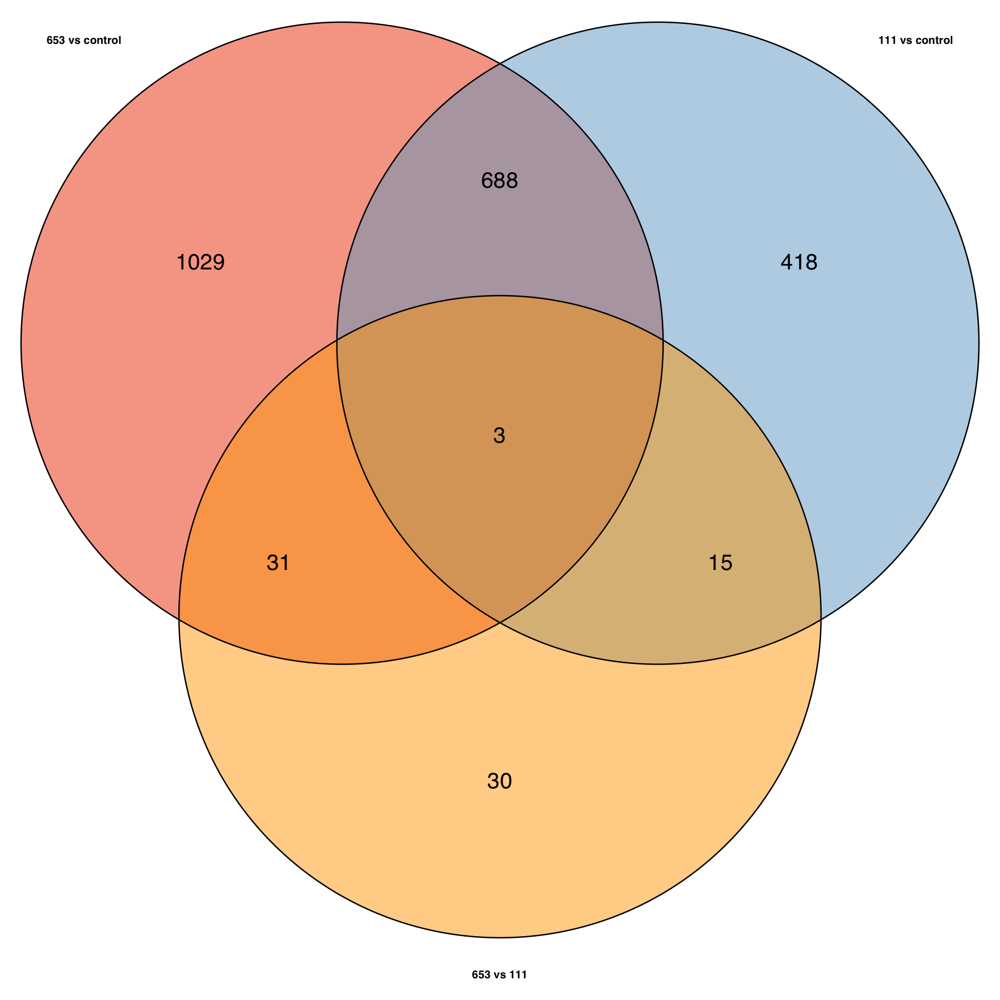

In [78]:
# tiff("/Users/davidwheeler/Desktop/RESEARCH/Data/TRANSCRIPTOMICS/FIGURES/Potato/Potato_VD.tiff",
#     width=9, height=9, units = 'in', res = 300)
venn.plot = venn.diagram(list(resSig_Cv653$id, resSig_Cv111$id, resSig_653v111$id),
            filename=NULL, 
            category.names=c("653 vs control", "111 vs control", "653 vs 111"),
            fill=c("orangered2","skyblue3","orange1"),
            alpha=c(0.5,0.5,0.5),
            cex=2,fontfamily = "sans",
            cat.cex=1, cat.fontface="bold", cat.fontfamily = "sans", 
            euler.d = TRUE, scaled = FALSE,
            height = 3000, width = 3000, 
            resolution = 500, imagetype = "tiff")

grid.draw(venn.plot)
# dev.off()

Sanity checks

In [79]:
1029+688+3+31 == length(resSig_Cv653$id)

[1] TRUE

In [80]:
688+418+3+15 == length(resSig_Cv111$id)

[1] TRUE

In [81]:
30+31+3+15 == length(resSig_653v111$id)

[1] TRUE

In [7]:
3/(1029+688+418+3+31+15+30)

[1] 0.001355014

### Export data<a class="anchor" id="twelveth-q"></a>  
[Back to Table of Contents](#toc-q)

* Control vs. 653

In [128]:
?read.csv()

In [ ]:
write.csv(as.data.frame(resSig_Cv653), 
          file="Mentha_DEGs_Cv653.csv")

* Control vs. 111

In [ ]:
write.csv(as.data.frame(resSig_Cv111), 
          file="Mentha_DEGs_Cv111.csv")

* 653 vs 111

In [ ]:
write.csv(as.data.frame(resSig_653v111), 
          file="Mentha_DEGs_653v111.csv")

### Graveyard<a class="anchor" id="thirteenth-q"></a>  
[Back to Table of Contents](#toc-q)

In [ ]:
# For each sample/row in the sample column
for (row in DF$Sample){
    # Split the sample by the underscore
    sample = strsplit(row,"_")
    # If sample contains S2, 
    if (grepl("S2",sample)){
    }
}

### Resources<a class="anchor" id="fourteenth-q"></a>  
[Back to Table of Contents](#toc-q)

 * R kernel installation: https://irkernel.github.io/installation/
 * DESeq2 installation: https://anaconda.org/bioconda/bioconductor-deseq2
 * DESeq2 data curation: https://www.bioconductor.org/packages/devel/bioc/vignettes/DEFormats/inst/doc/DEFormats.html
 * DESeq2 vignette: 
 http://bioconductor.org/packages/devel/bioc/vignettes/DESeq2/inst/doc/DESeq2.html
 http://master.bioconductor.org/packages/release/workflows/vignettes/rnaseqGene/inst/doc/rnaseqGene.html
 * Volcano plots: https://rdrr.io/github/kevinblighe/EnhancedVolcano/f/README.md
     * https://www.bioconductor.org/packages/release/bioc/vignettes/EnhancedVolcano/inst/doc/EnhancedVolcano.html
 